<a href="https://colab.research.google.com/github/hidayetyakupoglu/wind-data/blob/main/T_GF_new_cnn_SON_bigru_kalman.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install scikit-learn==1.0.2

In [ ]:
# prompt: https://github.com/hidayetyakupoglu/wind-data.git  bağlanmak istiyorum,

!git clone https://github.com/hidayetyakupoglu/wind-data.git


In [ ]:
!pip install openpyxl
!pip install xgboost
!pip install lightgbm
!pip install imbalanced-learn

In [ ]:
# prompt: /content/wind-data/wind_fault.xlsx klasörünü aç
import pandas as pd
import openpyxl





In [ ]:
import os
import pandas as pd
import numpy as np
from scipy import stats
from sklearn import preprocessing
import random
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import joblib
import seaborn as sns
sns.set(color_codes=True)
import matplotlib.pyplot as plt
from tensorflow import keras

from numpy.random import seed

#import logging
#logging.basicConfig(level=logging.DEBUG)
#tf._logging.set_verbosity(tf._logging.error)

#tensorflow.random.set_seed
from keras.layers import Input, Dropout, Dense, LSTM, TimeDistributed, RepeatVector
from keras.models import Model
from keras import regularizers
from keras.layers import GRU, LSTM
from sklearn.metrics import plot_confusion_matrix, classification_report
import plotly.express as px
from sklearn.preprocessing import Normalizer

from keras.layers import Dense
from keras.models import Sequential

from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

from scipy.spatial.distance import mahalanobis

import xgboost as xgb
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import plot_confusion_matrix, classification_report

from sklearn.neighbors import KNeighborsClassifier

from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.feature_selection import (f_classif, SelectKBest)
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from lightgbm import LGBMClassifier
from sklearn import metrics

from sklearn.feature_extraction.text import CountVectorizer


from imblearn.over_sampling import SMOTE

from matplotlib import pyplot as plt
import seaborn as sns

import tensorflow as tf
sns.set_style('whitegrid')
%matplotlib inline
import keras
import keras.backend as k
from keras.layers import GRU, LSTM
from keras.models import Sequential
from keras.models import Model
from keras import regularizers
from keras.callbacks import History
import warnings
warnings.filterwarnings("ignore")

In [ ]:
#df = pd.read_excel('/content/wind-data/T11_2016.xlsx')
df = pd.read_excel('/content/wind-data/wind_fault.xlsx')


In [3457]:
df1=df.copy()
# prompt: veri çerçevesine fault sütunu ekle, bu satırın fault değerine 'GF' diğerlerine 'NF' yaz

# Assuming 'df' is your DataFrame and the timestamp column is named 'Timestamp'
#df['Fault'] = 'NF'  # Initialize the 'Fault' column with 'NF' for all rows
#df.loc[df['Timestamp'] == '2016-03-03T19:20:00+00:00', 'Fault'] = 'GF'
#df.loc[df['Timestamp'] == '2016-10-17T17:50:00+00:00', 'Fault'] = 'HF'


In [3458]:
# prompt: Unnamed: 0 adlı sütunu sil
dd0=df.copy()
ddf=dd0.copy()
ddf.drop('Unnamed: 0', axis=1, inplace=True)
data=ddf.copy()
dd=data.copy()



In [3459]:
perc=0.30   # test oranı orn:0.3 ise %70 train %30 testtir
fau='GF'   # arıza türleridir 'GF' 'AF' 'MF' 'FF' 'EF'
fau

'GF'

In [3460]:
# prompt: dd Timestamp index yap ve sıraya koy

# Convert the 'Timestamp' column to datetime objects
#dd['Timestamp'] = pd.to_datetime(dd['Timestamp'])

# Set the 'Timestamp' column as the index
#dd = dd.set_index('Timestamp')

# Sort the DataFrame by the index (Timestamp)
#dd = dd.sort_index()

# Now your DataFrame 'dd' has a DateTimeIndex and is sorted chronologically.

In [3461]:
# prompt: Amb_WindSpeed_Max  ve Grd_Prod_Pwr_Max sütunlarının bulunduğu df oluştur

df_newf = dd[['WEC: max. windspeed', 'WEC: max. Power']]
print(df_newf)

       WEC: max. windspeed  WEC: max. Power
0                      9.4                0
1                      8.9                0
2                      9.5                0
3                      8.3                0
4                      9.7                0
...                    ...              ...
49129                  5.5              277
49130                  5.6              191
49131                  6.7              329
49132                  6.6              344
49133                  6.0              458

[49134 rows x 2 columns]


# Z-skoru yöntemi ile filtreleme
mean = df_newf.mean()
std_dev = df_newf.std()
z_scores = (df_newf - mean) / std_dev

threshold_z = 5
filtered_data_z = df_newf[(z_scores.abs() < threshold_z).all(axis=1)]

# IQR yöntemi ile filtreleme
Q1 = df_newf.quantile(0.25)
Q3 = df_newf.quantile(0.75)
IQR = Q3 - Q1
filtered_data_iqr = df_newf[~((df_newf < (Q1 - 1.5 * IQR)) | (df_newf > (Q3 + 1.5 * IQR))).any(axis=1)]

# Sonuçları görüntüleme
print("Z-skoru ile filtrelenmiş veri:")
print(filtered_data_z)
print("\nIQR ile filtrelenmiş veri:")
print(filtered_data_iqr)

# Z-skoru yöntemi ile filtreleme
mean = df_newf.mean()
std_dev = df_newf.std()
z_scores = (df_newf - mean) / std_dev

threshold_z = 5
filtered_data_z = df_newf[(z_scores.abs() < threshold_z).all(axis=1)]

# IQR yöntemi ile filtreleme
Q1 = df_newf.quantile(0.25)
Q3 = df_newf.quantile(0.75)
IQR = Q3 - Q1
filtered_data_iqr = df_newf[~((df_newf < (Q1 - 1.5 * IQR)) | (df_newf > (Q3 + 1.5 * IQR))).any(axis=1)]

# Sonuçları görüntüleme
print("Z-skoru ile filtrelenmiş veri:")
print(filtered_data_z)
print("\nIQR ile filtrelenmiş veri:")
print(filtered_data_iqr)

In [3462]:
# prompt: df_newf yalnızca NF leri seç

df_newf = dd[dd['Fault'] == 'NF'][['WEC: max. windspeed', 'WEC: max. Power']]
print(df_newf)

       WEC: max. windspeed  WEC: max. Power
0                      9.4                0
1                      8.9                0
2                      9.5                0
3                      8.3                0
4                      9.7                0
...                    ...              ...
49129                  5.5              277
49130                  5.6              191
49131                  6.7              329
49132                  6.6              344
49133                  6.0              458

[48581 rows x 2 columns]


In [3463]:
filtered_data_iqr=df_newf.copy()

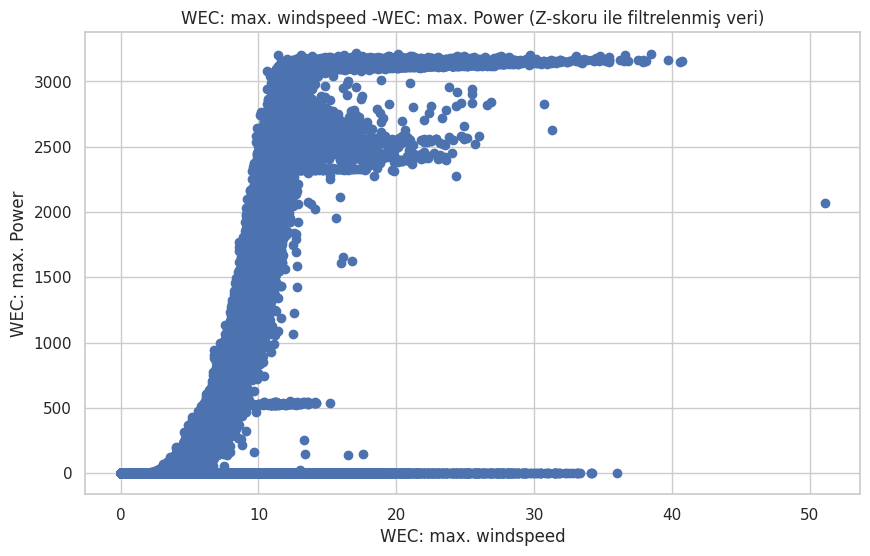

In [3464]:
# prompt: Z-skoru ile filtrelenmiş veri nin Amb_WindSpeed_Max -Grd_Prod_Pwr_Max grafiğini çiz

plt.figure(figsize=(10, 6))
plt.scatter(filtered_data_iqr['WEC: max. windspeed'], filtered_data_iqr['WEC: max. Power'])
plt.xlabel('WEC: max. windspeed')
plt.ylabel('WEC: max. Power')
plt.title('WEC: max. windspeed -WEC: max. Power (Z-skoru ile filtrelenmiş veri)')
plt.show()

In [3465]:
# prompt: (filtered_data_iqr['Amb_WindSpeed_Max'], filtered_data_iqr['Grd_Prod_Pwr_Max'] plotly ile çiz

fig = px.scatter(filtered_data_iqr, x='WEC: max. windspeed', y='WEC: max. Power',
                 title='Amb_WindSpeed_Max vs Grd_Prod_Pwr_Max (IQR ile filtrelenmiş veri)')
fig.show()

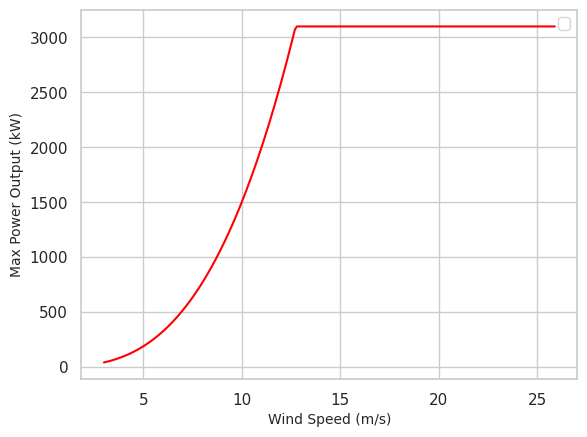

In [3466]:
  # Define the wind speed range
wind_speed = np.arange(3, 26, 0.1)  # From cut-in to cut-out speed

# Calculate power using the formula
power = ((wind_speed ** 3) * (0.5 * 3))

# Limit power to max power output
power[power > 3100] = 3100

# Plot the graph
plt.plot(wind_speed, power, color='red', label='')


plt.xlabel('Wind Speed (m/s)',fontsize=10)
plt.ylabel('Max Power Output (kW)',fontsize=10)
plt.title('',fontsize=10)
plt.grid(True)
plt.legend()
plt.show()

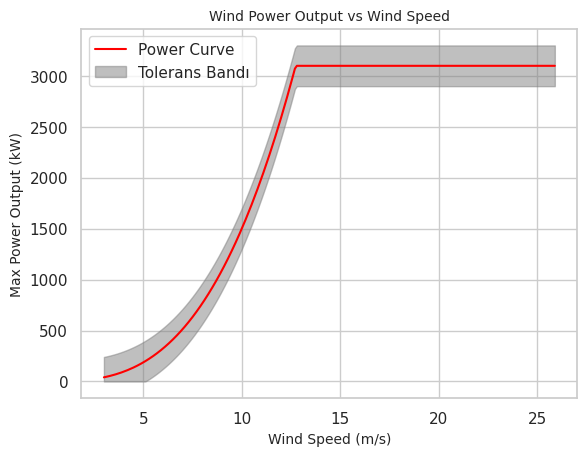

In [3467]:
import numpy as np
import matplotlib.pyplot as plt

# Define the wind speed range
wind_speed = np.arange(3, 26, 0.1)  # From cut-in to cut-out speed

# Calculate power using the formula: P = 0.5 * ρ * A * v^3
# Here, assuming density (ρ) = 1.225 kg/m^3 and area (A) = 1 m^2 for simplicity
power = ((wind_speed ** 3) * (0.5 * 3))

# Limit power to max power output
power[power > 3100] = 3100

# Define tolerans değerleri
tolerans = 200  # kW cinsinden tolerans

# Tolerans bandını hesapla
alt_limit = power - tolerans
ust_limit = power + tolerans

# Limitleri sıfıra düşmemesi için kontrol et
alt_limit[alt_limit < 0] = 0

# Plot the graph
plt.plot(wind_speed, power, color='red', label='Power Curve')
plt.fill_between(wind_speed, alt_limit, ust_limit, color='gray', alpha=0.5, label='Tolerans Bandı')

plt.xlabel('Wind Speed (m/s)', fontsize=10)
plt.ylabel('Max Power Output (kW)', fontsize=10)
plt.title('Wind Power Output vs Wind Speed', fontsize=10)
plt.grid(True)
plt.legend()
plt.show()


In [3468]:
# prompt: ddf'de NF tüm sütunlar için aykırı değerlerini boxplot ile göster ve aykırı değerleri temizle

import matplotlib.pyplot as plt
import pandas as pd #Added import for pandas

ddf=dd.copy()
# Sadece NF verilerini al
nf_data = ddf[ddf['Fault'] == 'NF']
fau_data= ddf[ddf['Fault'] != 'NF']
# fau_data= ddf[ddf['Fault'] == fau]

# Her sütun için boxplot çiz ve aykırı değerleri tespit et
for column in nf_data.columns[:-1]:  # Son sütun 'Fault', onu hariç tutuyoruz
  if nf_data[column].dtype != 'datetime64[ns]': #Datetime columns cannot be processed by boxplot


    # IQR kullanarak aykırı değerleri tespit et
    Q1 = nf_data[column].quantile(0.2)
    Q3 = nf_data[column].quantile(0.8)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Aykırı değerleri filtrele
    nf_data = nf_data[(nf_data[column] >= lower_bound) & (nf_data[column] <= upper_bound)]


# Temizlenmiş NF verilerini ddf'ye geri ata
ddf = pd.concat([ddf[ddf['Fault'] != 'NF'], nf_data]) # Changed append to concat


In [3469]:
ddf

,DateTime_x,WEC: ava. windspeed,WEC: max. windspeed,WEC: min. windspeed,WEC: ava. Rotation,WEC: max. Rotation,WEC: min. Rotation,WEC: ava. Power,WEC: max. Power,WEC: min. Power,...,Yaw inverter cabinet temp.,Fan inverter cabinet temp.,Ambient temp.,Tower temp.,Control cabinet temp.,Transformer temp.,RTU: ava. Setpoint 1,Inverter averages,Inverter std dev,Fault
1945,2014-05-14 14:39:00,5.7,7.4,4.1,9.98,10.23,9.72,0,0,0,...,23,27,17,26,35,34,2501,25.818182,0.603023,GF
1946,2014-05-14 14:50:00,6.4,8.6,2.7,4.12,10.71,0.70,0,0,0,...,23,27,17,26,35,34,2501,26.090910,0.943880,GF
1947,2014-05-14 14:58:00,5.6,7.5,4.0,9.99,10.20,9.80,0,0,0,...,23,27,17,26,35,34,2501,26.454546,0.820200,GF
1948,2014-05-14 15:09:00,5.3,6.6,4.1,9.98,10.17,9.79,0,0,0,...,23,27,18,26,35,34,2501,26.181818,0.873863,GF
1949,2014-05-14 15:20:00,5.1,7.2,3.8,9.99,10.17,9.80,0,0,0,...,23,28,18,26,35,34,2501,26.181818,0.981650,GF
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49129,2015-04-08 23:20:00,3.9,5.5,2.2,6.75,7.40,6.01,147,277,46,...,23,28,9,17,27,35,3050,24.454546,3.474583,NF
49130,2015-04-08 23:30:00,3.9,5.6,2.9,6.64,7.06,6.33,128,191,82,...,23,28,9,17,27,35,3050,24.454546,3.445683,NF
49131,2015-04-08 23:39:00,4.2,6.7,2.6,7.18,8.83,6.22,163,329,72,...,23,28,9,18,27,34,3050,24.363636,3.413876,NF
49132,2015-04-08 23:50:00,4.1,6.6,2.7,7.02,7.94,6.20,160,344,67,...,23,28,9,17,27,34,3050,24.000000,3.376389,NF


In [3470]:
# prompt: max wind speed > 15 ve max power output< 3000 olan NF verilerini temizle
ddf = ddf.drop(ddf[(ddf['WEC: max. windspeed'] > 25) & (ddf.iloc[:, -1] == 'NF')].index)
ddf = ddf.drop(ddf[(ddf['WEC: max. Power'] <= 0) & (ddf.iloc[:, -1] == 'NF')].index)
ddf = ddf.drop(ddf[(ddf['WEC: max. windspeed'] > 5) & (ddf['WEC: max. Power'] == 0) & (ddf.iloc[:, -1] == 'NF')].index)
ddf = ddf.drop(ddf[(ddf['WEC: max. Power'] > 3200) & (ddf.iloc[:, -1] == 'NF')].index)

In [3471]:
# prompt: Amb_WindSpeed_Max değeri 25 ten büyük olan verileri temizle

ddf = ddf[~(ddf['WEC: max. windspeed'] > 25)]
# prompt: ddf Amb_WindSpeed_Max Grd_Prod_Pwr_Max grafiğini plotly kullanarak çiz

import plotly.express as px

fig = px.scatter(ddf, x='WEC: max. windspeed', y='WEC: max. Power', title='Amb_WindSpeed_Max vs Grd_Prod_Pwr_Max')
fig.show()

In [3472]:
# prompt: rüzgar hızı 5 ten büyük olup max power 0 olanları sil



In [3473]:
# prompt: dd verisetindeki index değerlerininden ddf index değerlerinde eşit olan satırları seç

# Assuming 'dd' and 'ddf' are your DataFrames
# Find the common indices between dd and ddf
common_indices = dd.index.intersection(ddf.index)

# Select rows from 'dd' that have the same index values as in 'ddf'
data = dd.loc[common_indices]

# Print the selected rows from 'dd'
print(data)

               DateTime_x  WEC: ava. windspeed  WEC: max. windspeed  \
1945  2014-05-14 14:39:00                  5.7                  7.4   
1946  2014-05-14 14:50:00                  6.4                  8.6   
1947  2014-05-14 14:58:00                  5.6                  7.5   
1948  2014-05-14 15:09:00                  5.3                  6.6   
1949  2014-05-14 15:20:00                  5.1                  7.2   
...                   ...                  ...                  ...   
49129 2015-04-08 23:20:00                  3.9                  5.5   
49130 2015-04-08 23:30:00                  3.9                  5.6   
49131 2015-04-08 23:39:00                  4.2                  6.7   
49132 2015-04-08 23:50:00                  4.1                  6.6   
49133 2015-04-09 00:00:00                  4.8                  6.0   

       WEC: min. windspeed  WEC: ava. Rotation  WEC: max. Rotation  \
1945                   4.1                9.98               10.23   
1946   

In [3474]:
#data=dd    # filtresiz

In [3475]:
# prompt: data veri setine dd veri setinin GF ve HF satırlarını ilave et

# Assuming 'dd' is your DataFrame
# Create a new DataFrame with 'GF' and 'HF' rows from 'dd'
dd_GF_HF = dd[dd['Fault'].isin(['GF', 'MF','AF','FF','EF'])]

# Concatenate 'data' and 'dd_GF_HF' to create a combined DataFrame
data = pd.concat([data, dd_GF_HF])



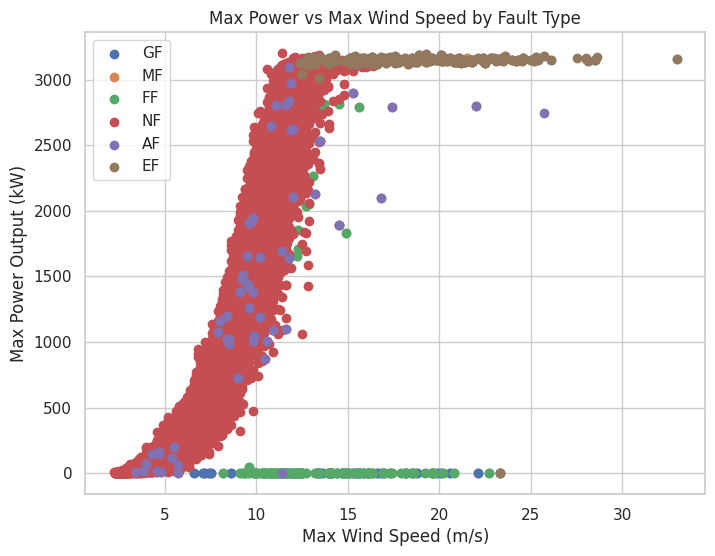

In [3476]:
plt.figure(figsize=(8, 6))
for fault in data['Fault'].unique():
  subset = data[data['Fault'] == fault]
  plt.scatter(subset['WEC: max. windspeed'], subset['WEC: max. Power'], label=fault)

plt.xlabel('Max Wind Speed (m/s)')
plt.ylabel('Max Power Output (kW)')
plt.title('Max Power vs Max Wind Speed by Fault Type')
plt.legend()
plt.grid(True)
plt.show()


In [3477]:
# prompt: PLOTLY İLE GÖSTER

import plotly.express as px

fig = px.scatter(ddf, x='WEC: max. windspeed', y='WEC: max. Power', color='Fault',
                 title='Amb_WindSpeed_Max vs Grd_Prod_Pwr_Max with Fault Type')
fig.show()

In [3478]:
#data = data[data['Fault'].isin([fau, 'NF'])]


In [3479]:
# Calculate the count of each fault class
fault_counts = data['Fault'].value_counts()

# Print the counts
print(fault_counts)


Fault
NF    29676
FF      497
EF      332
AF      123
GF       86
MF       40
Name: count, dtype: int64


data_n1 = data[(data['DateTime_x'] >= '2014-05-10') & (data['DateTime_x'] <= '2014-05-14 14:30:00	')]
data_n2 = data[(data['DateTime_x'] >= '2014-10-13') & (data['DateTime_x'] <= '2014-10-17 11:30:00	')]
data_n3 = data[(data['DateTime_x'] >= '2014-10-22') & (data['DateTime_x'] <= '2014-10-26 18:00:00	')]
data_n4 = data[(data['DateTime_x'] >= '2015-01-03') & (data['DateTime_x'] <= '2015-01-07 18:00:00	')]

In [3480]:
data = data.drop('WEC: Production kWh', axis=1)
data=data.drop('WEC: min. Power',axis=1)
data=data.drop('WEC: ava. available P from wind',axis=1)
data=data.drop('RTU: ava. Setpoint 1',axis=1)
#data_nf = data[data.Fault == 'NF'].sample(40000, random_state = 123)
data_nf=data[data.Fault == 'NF']
data_allF = data[data.Fault != 'NF']


In [3481]:
data=data.sort_index()

In [3482]:
data

,DateTime_x,WEC: ava. windspeed,WEC: max. windspeed,WEC: min. windspeed,WEC: ava. Rotation,WEC: max. Rotation,WEC: min. Rotation,WEC: ava. Power,WEC: max. Power,WEC: ava. Nacel position including cable twisting,...,Rectifier cabinet temp.,Yaw inverter cabinet temp.,Fan inverter cabinet temp.,Ambient temp.,Tower temp.,Control cabinet temp.,Transformer temp.,Inverter averages,Inverter std dev,Fault
1945,2014-05-14 14:39:00,5.7,7.4,4.1,9.98,10.23,9.72,0,0,-84,...,35,23,27,17,26,35,34,25.818182,0.603023,GF
1945,2014-05-14 14:39:00,5.7,7.4,4.1,9.98,10.23,9.72,0,0,-84,...,35,23,27,17,26,35,34,25.818182,0.603023,GF
1946,2014-05-14 14:50:00,6.4,8.6,2.7,4.12,10.71,0.70,0,0,-80,...,36,23,27,17,26,35,34,26.090910,0.943880,GF
1946,2014-05-14 14:50:00,6.4,8.6,2.7,4.12,10.71,0.70,0,0,-80,...,36,23,27,17,26,35,34,26.090910,0.943880,GF
1947,2014-05-14 14:58:00,5.6,7.5,4.0,9.99,10.20,9.80,0,0,-86,...,36,23,27,17,26,35,34,26.454546,0.820200,GF
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49129,2015-04-08 23:20:00,3.9,5.5,2.2,6.75,7.40,6.01,147,277,148,...,33,23,28,9,17,27,35,24.454546,3.474583,NF
49130,2015-04-08 23:30:00,3.9,5.6,2.9,6.64,7.06,6.33,128,191,148,...,34,23,28,9,17,27,35,24.454546,3.445683,NF
49131,2015-04-08 23:39:00,4.2,6.7,2.6,7.18,8.83,6.22,163,329,149,...,34,23,28,9,18,27,34,24.363636,3.413876,NF
49132,2015-04-08 23:50:00,4.1,6.6,2.7,7.02,7.94,6.20,160,344,151,...,33,23,28,9,17,27,34,24.000000,3.376389,NF


In [3483]:
# prompt: DUPLİKELERİ TEMİZLE

# ... (Your existing code) ...

# Assuming 'ddf' is your DataFrame
data = data.drop_duplicates()

# ... (Rest of your code) ...

In [3484]:
#data=data.set_index('DateTime_x')
data=data.sort_index()
data

,DateTime_x,WEC: ava. windspeed,WEC: max. windspeed,WEC: min. windspeed,WEC: ava. Rotation,WEC: max. Rotation,WEC: min. Rotation,WEC: ava. Power,WEC: max. Power,WEC: ava. Nacel position including cable twisting,...,Rectifier cabinet temp.,Yaw inverter cabinet temp.,Fan inverter cabinet temp.,Ambient temp.,Tower temp.,Control cabinet temp.,Transformer temp.,Inverter averages,Inverter std dev,Fault
1945,2014-05-14 14:39:00,5.7,7.4,4.1,9.98,10.23,9.72,0,0,-84,...,35,23,27,17,26,35,34,25.818182,0.603023,GF
1946,2014-05-14 14:50:00,6.4,8.6,2.7,4.12,10.71,0.70,0,0,-80,...,36,23,27,17,26,35,34,26.090910,0.943880,GF
1947,2014-05-14 14:58:00,5.6,7.5,4.0,9.99,10.20,9.80,0,0,-86,...,36,23,27,17,26,35,34,26.454546,0.820200,GF
1948,2014-05-14 15:09:00,5.3,6.6,4.1,9.98,10.17,9.79,0,0,-90,...,36,23,27,18,26,35,34,26.181818,0.873863,GF
1949,2014-05-14 15:20:00,5.1,7.2,3.8,9.99,10.17,9.80,0,0,-88,...,37,23,28,18,26,35,34,26.181818,0.981650,GF
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49129,2015-04-08 23:20:00,3.9,5.5,2.2,6.75,7.40,6.01,147,277,148,...,33,23,28,9,17,27,35,24.454546,3.474583,NF
49130,2015-04-08 23:30:00,3.9,5.6,2.9,6.64,7.06,6.33,128,191,148,...,34,23,28,9,17,27,35,24.454546,3.445683,NF
49131,2015-04-08 23:39:00,4.2,6.7,2.6,7.18,8.83,6.22,163,329,149,...,34,23,28,9,18,27,34,24.363636,3.413876,NF
49132,2015-04-08 23:50:00,4.1,6.6,2.7,7.02,7.94,6.20,160,344,151,...,33,23,28,9,17,27,34,24.000000,3.376389,NF


In [3485]:
#df_f = data[data['Fault'] != 'NF']
df_f = data[data['Fault'] == fau]

df_filtered = df_f.loc[df_f.groupby(df_f['DateTime_x'].dt.date)['DateTime_x'].idxmin()]

In [3486]:
df_filtered

,DateTime_x,WEC: ava. windspeed,WEC: max. windspeed,WEC: min. windspeed,WEC: ava. Rotation,WEC: max. Rotation,WEC: min. Rotation,WEC: ava. Power,WEC: max. Power,WEC: ava. Nacel position including cable twisting,...,Rectifier cabinet temp.,Yaw inverter cabinet temp.,Fan inverter cabinet temp.,Ambient temp.,Tower temp.,Control cabinet temp.,Transformer temp.,Inverter averages,Inverter std dev,Fault
1945,2014-05-14 14:39:00,5.7,7.400000,4.1,9.98,10.23,9.72,0,0,-84,...,35,23,27,17,26,35,34,25.818182,0.603023,GF
24322,2014-10-17 11:49:00,13.1,18.799999,3.7,6.14,10.63,0.00,0,0,186,...,23,25,27,17,19,27,45,34.181820,1.662419,GF
25484,2014-10-26 18:10:00,6.9,20.600000,2.6,0.16,1.68,0.00,0,0,273,...,16,19,19,15,16,19,17,17.545454,0.522233,GF
36038,2015-01-07 18:10:00,12.2,20.100000,2.6,8.53,10.44,0.00,0,0,-54,...,29,21,24,12,13,21,31,21.909090,1.375103,GF


In [3487]:

# Zaman endeksini ata
df_filtered.set_index('DateTime_x', inplace=True)
data_nf.set_index('DateTime_x', inplace=True)

# Verileri birleştir
combined_df = pd.concat([df_filtered, data_nf], axis=0)

# Zaman endeksine göre sırala
combined_df.sort_index(inplace=True)

# İndeksi sıfırla (isteğe bağlı)
# combined_df.reset_index(inplace=True)

combined_df



,WEC: ava. windspeed,WEC: max. windspeed,WEC: min. windspeed,WEC: ava. Rotation,WEC: max. Rotation,WEC: min. Rotation,WEC: ava. Power,WEC: max. Power,WEC: ava. Nacel position including cable twisting,WEC: ava. reactive Power,...,Rectifier cabinet temp.,Yaw inverter cabinet temp.,Fan inverter cabinet temp.,Ambient temp.,Tower temp.,Control cabinet temp.,Transformer temp.,Inverter averages,Inverter std dev,Fault
DateTime_x,,,,,,,,,,,,,,,,,,,,,
2014-05-14 14:39:00,5.7,7.4,4.1,9.98,10.23,9.72,0,0,-84,0,...,35,23,27,17,26,35,34,25.818182,0.603023,GF
2014-06-07 19:59:00,9.2,11.5,7.5,13.04,13.81,11.97,1804,2338,185,-5,...,28,29,32,16,34,42,60,34.090908,1.445998,NF
2014-06-07 20:10:00,9.3,12.2,7.0,13.07,14.16,11.87,1826,2720,183,-5,...,28,29,32,16,34,41,59,33.818180,1.537412,NF
2014-06-07 21:20:00,8.7,11.6,5.6,12.32,13.75,10.27,1513,2262,200,-3,...,28,29,32,16,33,42,60,33.818180,1.470930,NF
2014-06-07 21:29:00,8.6,12.1,5.7,12.27,13.52,9.50,1489,2070,198,-3,...,28,29,32,16,33,42,60,33.727272,1.348400,NF
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-04-08 23:20:00,3.9,5.5,2.2,6.75,7.40,6.01,147,277,148,34,...,33,23,28,9,17,27,35,24.454546,3.474583,NF
2015-04-08 23:30:00,3.9,5.6,2.9,6.64,7.06,6.33,128,191,148,35,...,34,23,28,9,17,27,35,24.454546,3.445683,NF
2015-04-08 23:39:00,4.2,6.7,2.6,7.18,8.83,6.22,163,329,149,36,...,34,23,28,9,18,27,34,24.363636,3.413876,NF


In [3488]:

data_af=combined_df.copy()
data_af = data_af.sort_index()
hdata=data_af['Fault'].replace('NF', 0, inplace=True)
hdata=data_af['Fault'].replace(fau, 1, inplace=True)


In [3489]:
# prompt: data_af Fault 0 değerinden farklı ise 1 koy

# Assuming 'data_af' is your DataFrame and 'Fault' is the column you want to modify
#data_af['Fault'] = np.where(data_af['Fault'] != 0, 1, data_af['Fault'])

In [3490]:
data_af

,WEC: ava. windspeed,WEC: max. windspeed,WEC: min. windspeed,WEC: ava. Rotation,WEC: max. Rotation,WEC: min. Rotation,WEC: ava. Power,WEC: max. Power,WEC: ava. Nacel position including cable twisting,WEC: ava. reactive Power,...,Rectifier cabinet temp.,Yaw inverter cabinet temp.,Fan inverter cabinet temp.,Ambient temp.,Tower temp.,Control cabinet temp.,Transformer temp.,Inverter averages,Inverter std dev,Fault
DateTime_x,,,,,,,,,,,,,,,,,,,,,
2014-05-14 14:39:00,5.7,7.4,4.1,9.98,10.23,9.72,0,0,-84,0,...,35,23,27,17,26,35,34,25.818182,0.603023,1
2014-06-07 19:59:00,9.2,11.5,7.5,13.04,13.81,11.97,1804,2338,185,-5,...,28,29,32,16,34,42,60,34.090908,1.445998,0
2014-06-07 20:10:00,9.3,12.2,7.0,13.07,14.16,11.87,1826,2720,183,-5,...,28,29,32,16,34,41,59,33.818180,1.537412,0
2014-06-07 21:20:00,8.7,11.6,5.6,12.32,13.75,10.27,1513,2262,200,-3,...,28,29,32,16,33,42,60,33.818180,1.470930,0
2014-06-07 21:29:00,8.6,12.1,5.7,12.27,13.52,9.50,1489,2070,198,-3,...,28,29,32,16,33,42,60,33.727272,1.348400,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-04-08 23:20:00,3.9,5.5,2.2,6.75,7.40,6.01,147,277,148,34,...,33,23,28,9,17,27,35,24.454546,3.474583,0
2015-04-08 23:30:00,3.9,5.6,2.9,6.64,7.06,6.33,128,191,148,35,...,34,23,28,9,17,27,35,24.454546,3.445683,0
2015-04-08 23:39:00,4.2,6.7,2.6,7.18,8.83,6.22,163,329,149,36,...,34,23,28,9,18,27,34,24.363636,3.413876,0


In [3491]:
# prompt: 2014-11-28 16:30:00 tarihinden sonraki satırları temizle

#data_af = data_af[data_af.index <= '2015-01-11 09:00:00']


In [3492]:
# prompt: duplikeleri sil

data_af = data_af[~data_af.index.duplicated(keep='first')]


In [3493]:
data_afx= data_af.drop(columns=['Fault'])
data_afy=data_af['Fault']

In [3494]:
data_afy

,Fault
DateTime_x,
2014-05-14 14:39:00,1
2014-06-07 19:59:00,0
2014-06-07 20:10:00,0
2014-06-07 21:20:00,0
2014-06-07 21:29:00,0
...,...
2015-04-08 23:20:00,0
2015-04-08 23:30:00,0
2015-04-08 23:39:00,0


In [3495]:
# prompt: data_af['Fault']==1 olan satırları göster

# Assuming 'data_af' is your DataFrame
rows_with_fault_1 = data_af[data_af['Fault'] == 1]
rows_with_fault_1

,WEC: ava. windspeed,WEC: max. windspeed,WEC: min. windspeed,WEC: ava. Rotation,WEC: max. Rotation,WEC: min. Rotation,WEC: ava. Power,WEC: max. Power,WEC: ava. Nacel position including cable twisting,WEC: ava. reactive Power,...,Rectifier cabinet temp.,Yaw inverter cabinet temp.,Fan inverter cabinet temp.,Ambient temp.,Tower temp.,Control cabinet temp.,Transformer temp.,Inverter averages,Inverter std dev,Fault
DateTime_x,,,,,,,,,,,,,,,,,,,,,
2014-05-14 14:39:00,5.7,7.400000,4.1,9.98,10.23,9.72,0,0,-84,0,...,35,23,27,17,26,35,34,25.818182,0.603023,1
2014-10-17 11:49:00,13.1,18.799999,3.7,6.14,10.63,0.00,0,0,186,0,...,23,25,27,17,19,27,45,34.181820,1.662419,1
2014-10-26 18:10:00,6.9,20.600000,2.6,0.16,1.68,0.00,0,0,273,0,...,16,19,19,15,16,19,17,17.545454,0.522233,1
2015-01-07 18:10:00,12.2,20.100000,2.6,8.53,10.44,0.00,0,0,-54,0,...,29,21,24,12,13,21,31,21.909090,1.375103,1


In [3496]:
scaler1 = preprocessing.MinMaxScaler()

x_new = pd.DataFrame(scaler1.fit_transform(data_afx),
                              columns = data_afx.columns,
                              index = data_afx.index)

In [3497]:

x_new

,WEC: ava. windspeed,WEC: max. windspeed,WEC: min. windspeed,WEC: ava. Rotation,WEC: max. Rotation,WEC: min. Rotation,WEC: ava. Power,WEC: max. Power,WEC: ava. Nacel position including cable twisting,WEC: ava. reactive Power,...,Main carrier temp.,Rectifier cabinet temp.,Yaw inverter cabinet temp.,Fan inverter cabinet temp.,Ambient temp.,Tower temp.,Control cabinet temp.,Transformer temp.,Inverter averages,Inverter std dev
DateTime_x,,,,,,,,,,,,,,,,,,,,,
2014-05-14 14:39:00,0.367521,0.282609,0.436170,0.695467,0.620464,0.712610,0.000000,0.000000,0.470091,0.031250,...,0.40,0.575758,0.40,0.370370,0.485714,0.689655,0.678571,0.386364,0.474820,0.044914
2014-06-07 19:59:00,0.666667,0.505435,0.797872,0.912181,0.880261,0.877566,0.635211,0.730625,0.632628,0.011719,...,0.72,0.363636,0.64,0.555556,0.457143,0.965517,0.928571,0.977273,0.802158,0.235647
2014-06-07 20:10:00,0.675214,0.543478,0.744681,0.914306,0.905660,0.870235,0.642958,0.850000,0.631420,0.011719,...,0.72,0.363636,0.64,0.555556,0.457143,0.965517,0.892857,0.954545,0.791367,0.256330
2014-06-07 21:20:00,0.623932,0.510870,0.595745,0.861190,0.875907,0.752933,0.532746,0.706875,0.641692,0.019531,...,0.68,0.363636,0.64,0.555556,0.457143,0.931034,0.928571,0.977273,0.791367,0.241288
2014-06-07 21:29:00,0.615385,0.538043,0.606383,0.857649,0.859216,0.696481,0.524296,0.646875,0.640483,0.019531,...,0.68,0.363636,0.64,0.555556,0.457143,0.931034,0.928571,0.977273,0.787770,0.213564
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-04-08 23:20:00,0.213675,0.179348,0.234043,0.466714,0.415094,0.440616,0.051761,0.086563,0.610272,0.164062,...,0.48,0.515152,0.40,0.407407,0.257143,0.379310,0.392857,0.409091,0.420863,0.694638
2015-04-08 23:30:00,0.213675,0.184783,0.308511,0.458924,0.390421,0.464076,0.045070,0.059688,0.610272,0.167969,...,0.44,0.545455,0.40,0.407407,0.257143,0.379310,0.392857,0.409091,0.420863,0.688099
2015-04-08 23:39:00,0.239316,0.244565,0.276596,0.497167,0.518868,0.456012,0.057394,0.102813,0.610876,0.171875,...,0.44,0.545455,0.40,0.407407,0.257143,0.413793,0.392857,0.386364,0.417266,0.680902


In [3498]:
# prompt: xnew inverse transform

x_original = scaler1.inverse_transform(x_new)
x_original = pd.DataFrame(x_original, columns=data_afx.columns, index=data_afx.index)
x_original

,WEC: ava. windspeed,WEC: max. windspeed,WEC: min. windspeed,WEC: ava. Rotation,WEC: max. Rotation,WEC: min. Rotation,WEC: ava. Power,WEC: max. Power,WEC: ava. Nacel position including cable twisting,WEC: ava. reactive Power,...,Main carrier temp.,Rectifier cabinet temp.,Yaw inverter cabinet temp.,Fan inverter cabinet temp.,Ambient temp.,Tower temp.,Control cabinet temp.,Transformer temp.,Inverter averages,Inverter std dev
DateTime_x,,,,,,,,,,,,,,,,,,,,,
2014-05-14 14:39:00,5.7,7.4,4.1,9.98,10.23,9.72,0.0,0.0,-84.0,0.0,...,14.0,35.0,23.0,27.0,17.0,26.0,35.0,34.0,25.818182,0.603023
2014-06-07 19:59:00,9.2,11.5,7.5,13.04,13.81,11.97,1804.0,2338.0,185.0,-5.0,...,22.0,28.0,29.0,32.0,16.0,34.0,42.0,60.0,34.090908,1.445998
2014-06-07 20:10:00,9.3,12.2,7.0,13.07,14.16,11.87,1826.0,2720.0,183.0,-5.0,...,22.0,28.0,29.0,32.0,16.0,34.0,41.0,59.0,33.818180,1.537412
2014-06-07 21:20:00,8.7,11.6,5.6,12.32,13.75,10.27,1513.0,2262.0,200.0,-3.0,...,21.0,28.0,29.0,32.0,16.0,33.0,42.0,60.0,33.818180,1.470930
2014-06-07 21:29:00,8.6,12.1,5.7,12.27,13.52,9.50,1489.0,2070.0,198.0,-3.0,...,21.0,28.0,29.0,32.0,16.0,33.0,42.0,60.0,33.727272,1.348400
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-04-08 23:20:00,3.9,5.5,2.2,6.75,7.40,6.01,147.0,277.0,148.0,34.0,...,16.0,33.0,23.0,28.0,9.0,17.0,27.0,35.0,24.454546,3.474583
2015-04-08 23:30:00,3.9,5.6,2.9,6.64,7.06,6.33,128.0,191.0,148.0,35.0,...,15.0,34.0,23.0,28.0,9.0,17.0,27.0,35.0,24.454546,3.445683
2015-04-08 23:39:00,4.2,6.7,2.6,7.18,8.83,6.22,163.0,329.0,149.0,36.0,...,15.0,34.0,23.0,28.0,9.0,18.0,27.0,34.0,24.363636,3.413876


In [3499]:
x_new=x_original.copy()

In [3500]:
# prompt: Xgboost ile feature selection uygulka

import xgboost as xgb

# Create an XGBClassifier object
model = xgb.XGBClassifier()


# Fit the model to the data
model.fit(x_new, data_afy)

# Get the feature importances
importances = model.feature_importances_

# Create a dataframe with feature names and importances
feature_importances = pd.DataFrame({'feature': x_new.columns, 'importance': importances})

# Sort the dataframe by importance
feature_importances = feature_importances.sort_values('importance', ascending=False)

# Print the top 10 features
print(feature_importances.head(15))

# Select the top 10 features
selected_features_top = feature_importances['feature'][:15]
selected_features_top = feature_importances.nlargest(int(len(feature_importances) * 0.2), 'importance')

print("Top 5% of features by importance:")
selected_features_top


                                              feature  importance
1                                 WEC: max. windspeed    0.212993
2                                 WEC: min. windspeed    0.177122
10                           WEC: max. reactive Power    0.129356
7                                     WEC: max. Power    0.124516
4                                  WEC: max. Rotation    0.111189
9                            WEC: ava. reactive Power    0.110483
37                                      Rotor temp. 2    0.053632
6                                     WEC: ava. Power    0.045520
38                                     Stator temp. 1    0.013836
53                                   Inverter std dev    0.007999
8   WEC: ava. Nacel position including cable twisting    0.006959
29                                 Rear bearing temp.    0.006395
42                                      Nacelle temp.    0.000000
35                                      Blade C temp.    0.000000
36        

,feature,importance
1,WEC: max. windspeed,0.212993
2,WEC: min. windspeed,0.177122
10,WEC: max. reactive Power,0.129356
7,WEC: max. Power,0.124516
4,WEC: max. Rotation,0.111189
9,WEC: ava. reactive Power,0.110483
37,Rotor temp. 2,0.053632
6,WEC: ava. Power,0.045520
38,Stator temp. 1,0.013836
53,Inverter std dev,0.007999


In [3501]:
# Ensure x_new and data_afy have the same number of rows
x_new = x_new.loc[data_afy.index]  # Select rows from x_new that match the index of data_afy

# Convert data_afy to a consistent data type (e.g., all integers)
data_afy = pd.to_numeric(data_afy, errors='coerce') # 'coerce' will replace invalid values with NaN

# If you have NaN values after conversion, handle them (e.g., drop rows or impute values)
# For this example, let's drop rows with NaNs
data_afy = data_afy.dropna()
x_new = x_new.loc[data_afy.index]  # Update x_new again after dropping NaNs from data_afy

# Create an XGBClassifier object
model = xgb.XGBClassifier()

# Fit the model to the data
model.fit(x_new, data_afy)

# Get the feature importances
importances = model.feature_importances_

# Create a dataframe with feature names and importances
feature_importances = pd.DataFrame({'feature': x_new.columns, 'importance': importances})

# Sort the dataframe by importance
feature_importances = feature_importances.sort_values('importance', ascending=False)

# Print the top 10 features
print(feature_importances.head(15))

# Select the top 10 features
selected_features_xgb = feature_importances['feature'][:15]

# Assuming 'feature_importances' DataFrame is already created as in your code
selected_features_top = feature_importances.nlargest(int(len(feature_importances) * 0.2), 'importance')

print("Top 5% of features by importance:")
selected_features_top

                                              feature  importance
1                                 WEC: max. windspeed    0.212993
2                                 WEC: min. windspeed    0.177122
10                           WEC: max. reactive Power    0.129356
7                                     WEC: max. Power    0.124516
4                                  WEC: max. Rotation    0.111189
9                            WEC: ava. reactive Power    0.110483
37                                      Rotor temp. 2    0.053632
6                                     WEC: ava. Power    0.045520
38                                     Stator temp. 1    0.013836
53                                   Inverter std dev    0.007999
8   WEC: ava. Nacel position including cable twisting    0.006959
29                                 Rear bearing temp.    0.006395
42                                      Nacelle temp.    0.000000
35                                      Blade C temp.    0.000000
36        

,feature,importance
1,WEC: max. windspeed,0.212993
2,WEC: min. windspeed,0.177122
10,WEC: max. reactive Power,0.129356
7,WEC: max. Power,0.124516
4,WEC: max. Rotation,0.111189
9,WEC: ava. reactive Power,0.110483
37,Rotor temp. 2,0.053632
6,WEC: ava. Power,0.045520
38,Stator temp. 1,0.013836
53,Inverter std dev,0.007999


In [3502]:
# prompt: selected_features_top minimum importance değeri



In [3503]:
# prompt: feature selection threshold 0.02 nin altındakileri çıkart

# Filter features with importance greater than 0.02,
minimum_importance = selected_features_top['importance'].min()
selected_features_xgb = feature_importances[feature_importances['importance'] >= minimum_importance]['feature']
dim=len(selected_features_xgb)
dim


10

In [3504]:
# prompt: kaç adet olduğunu belirle

len(selected_features_xgb)


10

In [3505]:
# prompt: Dense-Net kullanarak feature selection yap
'''

from keras.layers import Dense
from keras.models import Sequential
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(x_new, data_afy, test_size=0.2, random_state=42)

# Define the Dense-Net model
model = Sequential()
model.add(Dense(64, activation='tanh', input_shape=(x_new.shape[1],)))
model.add(Dense(32, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=20, batch_size=32)

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print('Test accuracy:', accuracy)

# Get the feature importances from the trained model
importances = model.layers[0].get_weights()[0]
feature_importances = pd.DataFrame({'feature': x_new.columns, 'importance': np.mean(np.abs(importances), axis=1)})
feature_importances = feature_importances.sort_values('importance', ascending=False)

# Print the top 10 features
print(feature_importances.head(15))

# Select the top 10 features
selected_features_dense = feature_importances['feature'][:15]

'''

"\n\nfrom keras.layers import Dense\nfrom keras.models import Sequential\nfrom sklearn.model_selection import train_test_split\n\n# Split the data into training and testing sets\nX_train, X_test, y_train, y_test = train_test_split(x_new, data_afy, test_size=0.2, random_state=42)\n\n# Define the Dense-Net model\nmodel = Sequential()\nmodel.add(Dense(64, activation='tanh', input_shape=(x_new.shape[1],)))\nmodel.add(Dense(32, activation='relu'))\nmodel.add(Dense(1, activation='sigmoid'))\n\n# Compile the model\nmodel.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])\n\n# Train the model\nmodel.fit(X_train, y_train, epochs=20, batch_size=32)\n\n# Evaluate the model\nloss, accuracy = model.evaluate(X_test, y_test)\nprint('Test accuracy:', accuracy)\n\n# Get the feature importances from the trained model\nimportances = model.layers[0].get_weights()[0]\nfeature_importances = pd.DataFrame({'feature': x_new.columns, 'importance': np.mean(np.abs(importances), axis=1)})\

In [3506]:
my_dict = {}
my_list = selected_features_xgb          #kbest             common_selected               #my_list = selectlist
my_tuple = tuple(my_list)
my_dict[my_tuple] = "value"
my_tuple


('WEC: max. windspeed',
 'WEC: min. windspeed',
 'WEC: max. reactive Power',
 'WEC: max. Power',
 'WEC: max. Rotation',
 'WEC: ava. reactive Power',
 'Rotor temp. 2',
 'WEC: ava. Power',
 'Stator temp. 1',
 'Inverter std dev')

In [3507]:
x_new = x_new.reindex(columns = my_tuple)
x_new['Fault']=data_af['Fault']
data_af=x_new

corr_matrixx = data_af.corr()
corr_matrixx['Fault'].sort_values(ascending=False)

,Fault
Fault,1.000000
WEC: max. windspeed,0.039583
WEC: max. Rotation,-0.006935
WEC: min. windspeed,-0.007180
Inverter std dev,-0.012257
WEC: ava. Power,-0.013246
WEC: max. Power,-0.013348
WEC: max. reactive Power,-0.015874
WEC: ava. reactive Power,-0.018270
Stator temp. 1,-0.025960


In [3508]:
# Filter out columns that do not contain "temp"
#data_af = data_af[[col for col in data_af.columns if 'temp.' in col.lower() or col == 'Fault']]
# Filter out columns that do not contain "temp"
#selected_features_xgb = [col for col in selected_features_xgb if 'temp.' in col.lower() or col == 'Fault']

In [3509]:
corr_matrixx = data_af.corr()
corr_matrixx['Fault'].sort_values(ascending=False)

,Fault
Fault,1.000000
WEC: max. windspeed,0.039583
WEC: max. Rotation,-0.006935
WEC: min. windspeed,-0.007180
Inverter std dev,-0.012257
WEC: ava. Power,-0.013246
WEC: max. Power,-0.013348
WEC: max. reactive Power,-0.015874
WEC: ava. reactive Power,-0.018270
Stator temp. 1,-0.025960


In [3510]:
data_af

,WEC: max. windspeed,WEC: min. windspeed,WEC: max. reactive Power,WEC: max. Power,WEC: max. Rotation,WEC: ava. reactive Power,Rotor temp. 2,WEC: ava. Power,Stator temp. 1,Inverter std dev,Fault
DateTime_x,,,,,,,,,,,
2014-05-14 14:39:00,7.4,4.1,0.0,0.0,10.23,0.0,33.0,0.0,34.0,0.603023,1
2014-06-07 19:59:00,11.5,7.5,-1.0,2338.0,13.81,-5.0,66.0,1804.0,79.0,1.445998,0
2014-06-07 20:10:00,12.2,7.0,3.0,2720.0,14.16,-5.0,64.0,1826.0,78.0,1.537412,0
2014-06-07 21:20:00,11.6,5.6,7.0,2262.0,13.75,-3.0,65.0,1513.0,79.0,1.470930,0
2014-06-07 21:29:00,12.1,5.7,9.0,2070.0,13.52,-3.0,62.0,1489.0,76.0,1.348400,0
...,...,...,...,...,...,...,...,...,...,...,...
2015-04-08 23:20:00,5.5,2.2,42.0,277.0,7.40,34.0,47.0,147.0,46.0,3.474583,0
2015-04-08 23:30:00,5.6,2.9,43.0,191.0,7.06,35.0,46.0,128.0,46.0,3.445683,0
2015-04-08 23:39:00,6.7,2.6,44.0,329.0,8.83,36.0,46.0,163.0,46.0,3.413876,0


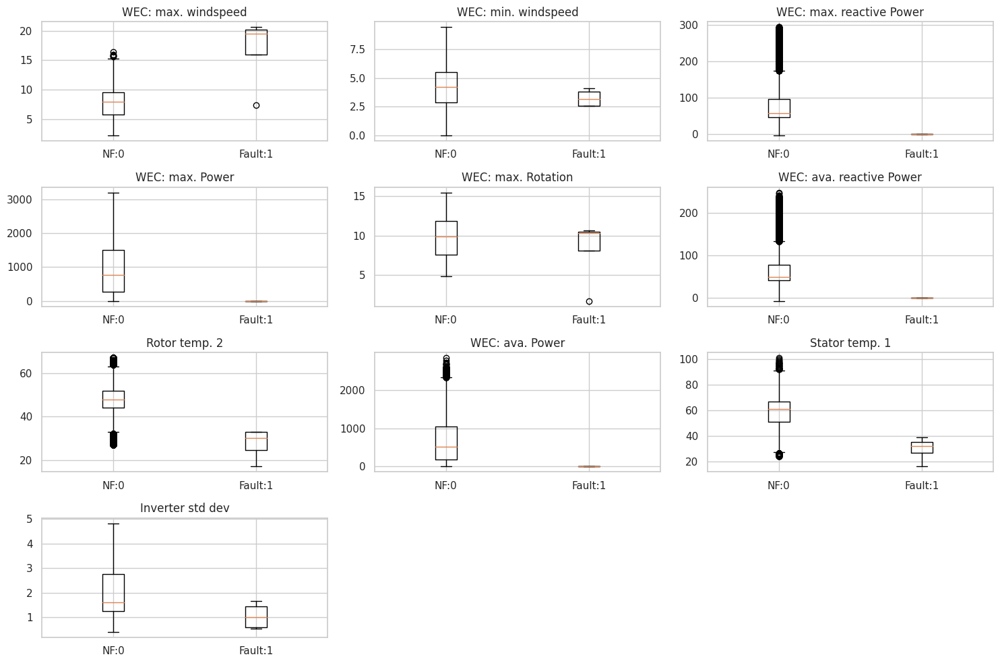

In [3511]:


features = selected_features_xgb
ddf=data_af.copy()

# Filter the data for NF and EF
data_nf = ddf[ddf['Fault'] == 0][features]
data_ef = ddf[ddf['Fault'] == 1][features]

# Create box plots for each feature
plt.figure(figsize=(15, 10))

# Calculate the number of rows and columns for subplots
num_rows = int(len(features) / 3) + (len(features) % 3 > 0)  # Calculate the number of rows needed

for i, feature in enumerate(features):
  plt.subplot(num_rows, 3, i + 1) # Use num_rows to create enough subplots
  plt.boxplot([data_nf[feature], data_ef[feature]], labels=['NF:0', 'Fault:1'])
  plt.title(feature)

plt.tight_layout()
plt.show()


In [3512]:
# prompt: data_nf remove outliers

# Sadece NF verilerini al
nf_data = data_af[data_af['Fault'] == 0]

# Her sütun için boxplot çiz ve aykırı değerleri tespit et
for column in nf_data.columns[:-1]:  # Son sütun 'Fault', onu hariç tutuyoruz
  if nf_data[column].dtype != 'datetime64[ns]': #Datetime columns cannot be processed by boxplot


    # IQR kullanarak aykırı değerleri tespit et
    Q1 = nf_data[column].quantile(0.25)
    Q3 = nf_data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Aykırı değerleri filtrele
    nf_data = nf_data[(nf_data[column] >= lower_bound) & (nf_data[column] <= upper_bound)]


# Temizlenmiş NF verilerini ddf'ye geri ata
data_af = pd.concat([data_af[data_af['Fault'] != 0], nf_data]) # Changed append to concat

data_af=data_af.sort_index()


In [3513]:
# prompt: remove ef_data outliers

# Sadece EF verilerini al
ef_data = data_af[data_af['Fault'] == 1]

# Her sütun için boxplot çiz ve aykırı değerleri tespit et
for column in ef_data.columns[:-1]:  # Son sütun 'Fault', onu hariç tutuyoruz
  if ef_data[column].dtype != 'datetime64[ns]': #Datetime columns cannot be processed by boxplot


    # IQR kullanarak aykırı değerleri tespit et
    Q1 = ef_data[column].quantile(0.25)
    Q3 = ef_data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Aykırı değerleri filtrele
    ef_data = ef_data[(ef_data[column] >= lower_bound) & (ef_data[column] <= upper_bound)]


# Temizlenmiş EF verilerini data_af'ye geri ata
data_af = pd.concat([data_af[data_af['Fault'] != 1], ef_data]) # Changed append to concat

data_af=data_af.sort_index()


In [3514]:
data_af

,WEC: max. windspeed,WEC: min. windspeed,WEC: max. reactive Power,WEC: max. Power,WEC: max. Rotation,WEC: ava. reactive Power,Rotor temp. 2,WEC: ava. Power,Stator temp. 1,Inverter std dev,Fault
DateTime_x,,,,,,,,,,,
2014-06-08 20:10:00,12.8,4.2,24.0,1589.0,12.66,9.0,55.0,873.0,71.0,1.328020,0
2014-06-08 20:21:00,11.5,4.8,29.0,2244.0,13.76,8.0,53.0,1005.0,69.0,1.221028,0
2014-06-08 21:20:00,10.3,5.0,16.0,1953.0,13.36,5.0,53.0,1050.0,71.0,1.286291,0
2014-06-09 18:40:00,10.3,4.6,22.0,1732.0,13.00,5.0,59.0,1095.0,74.0,1.300350,0
2014-06-09 18:49:00,10.8,4.3,13.0,1515.0,12.47,3.0,57.0,1123.0,72.0,1.183216,0
...,...,...,...,...,...,...,...,...,...,...,...
2015-04-08 23:20:00,5.5,2.2,42.0,277.0,7.40,34.0,47.0,147.0,46.0,3.474583,0
2015-04-08 23:30:00,5.6,2.9,43.0,191.0,7.06,35.0,46.0,128.0,46.0,3.445683,0
2015-04-08 23:39:00,6.7,2.6,44.0,329.0,8.83,36.0,46.0,163.0,46.0,3.413876,0


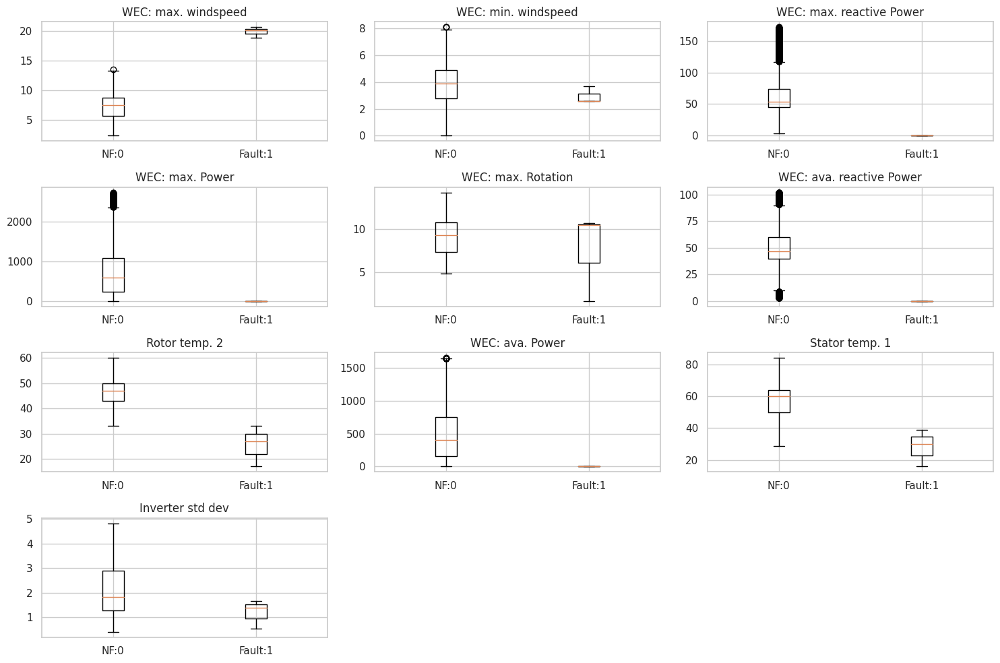

In [3515]:
features = selected_features_xgb
ddf=data_af.copy()

# Filter the data for NF and EF
data_nf = ddf[ddf['Fault'] == 0][features]
data_ef = ddf[ddf['Fault'] == 1][features]

# Create box plots for each feature
plt.figure(figsize=(15, 10))

# Calculate the number of rows and columns for subplots
num_rows = int(len(features) / 3) + (len(features) % 3 > 0)  # Calculate the number of rows needed

for i, feature in enumerate(features):
  plt.subplot(num_rows, 3, i + 1) # Use num_rows to create enough subplots
  plt.boxplot([data_nf[feature], data_ef[feature]], labels=['NF:0', 'Fault:1'])
  plt.title(feature)

plt.tight_layout()
plt.show()


In [3516]:
# prompt: data_af features rolling lerini al

# Assuming you want to calculate rolling features for the selected features

rolling_window = 100  # Define the rolling window size

for feature in selected_features_xgb:
  # Calculate the rolling mean
 data_af[f'{feature}_rolling_mean'] = data_af[feature].rolling(window=rolling_window, center=True).mean()

  # Calculate the rolling standard deviation
 data_af[f'{feature}_rolling_std'] = data_af[feature].rolling(window=rolling_window, center=True).std()

  # Calculate the rolling max
 data_af[f'{feature}_rolling_max'] = data_af[feature].rolling(window=rolling_window, center=True).max()

  # Calculate the rolling min
 data_af[f'{feature}_rolling_min'] = data_af[feature].rolling(window=rolling_window, center=True).min()

# Now, data_af contains the rolling mean, standard deviation, max, and min for each selected feature.
print(data_af.head())

                     WEC: max. windspeed  WEC: min. windspeed  \
DateTime_x                                                      
2014-06-08 20:10:00                 12.8                  4.2   
2014-06-08 20:21:00                 11.5                  4.8   
2014-06-08 21:20:00                 10.3                  5.0   
2014-06-09 18:40:00                 10.3                  4.6   
2014-06-09 18:49:00                 10.8                  4.3   

                     WEC: max. reactive Power  WEC: max. Power  \
DateTime_x                                                       
2014-06-08 20:10:00                      24.0           1589.0   
2014-06-08 20:21:00                      29.0           2244.0   
2014-06-08 21:20:00                      16.0           1953.0   
2014-06-09 18:40:00                      22.0           1732.0   
2014-06-09 18:49:00                      13.0           1515.0   

                     WEC: max. Rotation  WEC: ava. reactive Power  \
DateTime_x  

In [3517]:
# prompt: Nan değerleri olmasın

data_af = data_af.fillna(method='ffill').fillna(method='bfill')

In [3518]:
# prompt: data_af de Fault sütununu en sağa

# Move 'Fault' column to the rightmost position
cols = list(data_af.columns)
cols.remove('Fault')
cols.append('Fault')
data_af = data_af[cols]


In [3519]:
data_af[data_af['Fault'] != 0]

,WEC: max. windspeed,WEC: min. windspeed,WEC: max. reactive Power,WEC: max. Power,WEC: max. Rotation,WEC: ava. reactive Power,Rotor temp. 2,WEC: ava. Power,Stator temp. 1,Inverter std dev,...,WEC: ava. Power_rolling_min,Stator temp. 1_rolling_mean,Stator temp. 1_rolling_std,Stator temp. 1_rolling_max,Stator temp. 1_rolling_min,Inverter std dev_rolling_mean,Inverter std dev_rolling_std,Inverter std dev_rolling_max,Inverter std dev_rolling_min,Fault
DateTime_x,,,,,,,,,,,,,,,,,,,,,
2014-10-17 11:49:00,18.799999,3.7,0.0,0.0,10.63,0.0,33.0,0.0,39.0,1.662419,...,0.0,66.95,6.243178,78.0,39.0,1.420103,0.485074,3.717282,0.632456,1
2014-10-26 18:10:00,20.600000,2.6,0.0,0.0,1.68,0.0,17.0,0.0,16.0,0.522233,...,0.0,63.09,6.684967,77.0,16.0,1.760763,0.902646,4.109855,0.404520,1
2015-01-07 18:10:00,20.100000,2.6,0.0,0.0,10.44,0.0,27.0,0.0,30.0,1.375103,...,0.0,64.47,4.795737,74.0,30.0,1.367451,0.421295,2.866737,0.700649,1


In [3520]:
# prompt: 2014-11- 01:49:00	tarihinden itibaren test verisi olsun

#test_date = '2014-10-10 02:00:00'





In [3521]:
data_af


,WEC: max. windspeed,WEC: min. windspeed,WEC: max. reactive Power,WEC: max. Power,WEC: max. Rotation,WEC: ava. reactive Power,Rotor temp. 2,WEC: ava. Power,Stator temp. 1,Inverter std dev,...,WEC: ava. Power_rolling_min,Stator temp. 1_rolling_mean,Stator temp. 1_rolling_std,Stator temp. 1_rolling_max,Stator temp. 1_rolling_min,Inverter std dev_rolling_mean,Inverter std dev_rolling_std,Inverter std dev_rolling_max,Inverter std dev_rolling_min,Fault
DateTime_x,,,,,,,,,,,,,,,,,,,,,
2014-06-08 20:10:00,12.8,4.2,24.0,1589.0,12.66,9.0,55.0,873.0,71.0,1.328020,...,215.0,64.89,3.097392,74.0,59.0,1.293739,0.525618,2.932576,0.522233,0
2014-06-08 20:21:00,11.5,4.8,29.0,2244.0,13.76,8.0,53.0,1005.0,69.0,1.221028,...,215.0,64.89,3.097392,74.0,59.0,1.293739,0.525618,2.932576,0.522233,0
2014-06-08 21:20:00,10.3,5.0,16.0,1953.0,13.36,5.0,53.0,1050.0,71.0,1.286291,...,215.0,64.89,3.097392,74.0,59.0,1.293739,0.525618,2.932576,0.522233,0
2014-06-09 18:40:00,10.3,4.6,22.0,1732.0,13.00,5.0,59.0,1095.0,74.0,1.300350,...,215.0,64.89,3.097392,74.0,59.0,1.293739,0.525618,2.932576,0.522233,0
2014-06-09 18:49:00,10.8,4.3,13.0,1515.0,12.47,3.0,57.0,1123.0,72.0,1.183216,...,215.0,64.89,3.097392,74.0,59.0,1.293739,0.525618,2.932576,0.522233,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-04-08 23:20:00,5.5,2.2,42.0,277.0,7.40,34.0,47.0,147.0,46.0,3.474583,...,1.0,45.48,7.239733,57.0,32.0,2.814190,0.668845,3.635682,1.009050,0
2015-04-08 23:30:00,5.6,2.9,43.0,191.0,7.06,35.0,46.0,128.0,46.0,3.445683,...,1.0,45.48,7.239733,57.0,32.0,2.814190,0.668845,3.635682,1.009050,0
2015-04-08 23:39:00,6.7,2.6,44.0,329.0,8.83,36.0,46.0,163.0,46.0,3.413876,...,1.0,45.48,7.239733,57.0,32.0,2.814190,0.668845,3.635682,1.009050,0


In [3522]:
# prompt: Fault=1 olan tarihten 5 gün önceye git

# Find the index of the row where Fault = 1
fault_index = data_af[data_af['Fault'] == 1].index[0]

# Calculate the date 5 days before the Fault = 1 date
before = fault_index - pd.Timedelta(days=10)

# Print the calculated date
print(before)

# Now you can use this date to split your data into train and test sets.
#trainhy = data_af[data_af.index < before]
#testhy = data_af[data_af.index >= before]

2014-10-07 11:49:00


In [3523]:
test_date = '2014-10-08'


trainhy = data_af[data_af.index < test_date]
testhy = data_af[data_af.index >= test_date]

In [3524]:
trainhy

,WEC: max. windspeed,WEC: min. windspeed,WEC: max. reactive Power,WEC: max. Power,WEC: max. Rotation,WEC: ava. reactive Power,Rotor temp. 2,WEC: ava. Power,Stator temp. 1,Inverter std dev,...,WEC: ava. Power_rolling_min,Stator temp. 1_rolling_mean,Stator temp. 1_rolling_std,Stator temp. 1_rolling_max,Stator temp. 1_rolling_min,Inverter std dev_rolling_mean,Inverter std dev_rolling_std,Inverter std dev_rolling_max,Inverter std dev_rolling_min,Fault
DateTime_x,,,,,,,,,,,,,,,,,,,,,
2014-06-08 20:10:00,12.8,4.2,24.0,1589.0,12.66,9.0,55.0,873.0,71.0,1.328020,...,215.0,64.89,3.097392,74.0,59.0,1.293739,0.525618,2.932576,0.522233,0
2014-06-08 20:21:00,11.5,4.8,29.0,2244.0,13.76,8.0,53.0,1005.0,69.0,1.221028,...,215.0,64.89,3.097392,74.0,59.0,1.293739,0.525618,2.932576,0.522233,0
2014-06-08 21:20:00,10.3,5.0,16.0,1953.0,13.36,5.0,53.0,1050.0,71.0,1.286291,...,215.0,64.89,3.097392,74.0,59.0,1.293739,0.525618,2.932576,0.522233,0
2014-06-09 18:40:00,10.3,4.6,22.0,1732.0,13.00,5.0,59.0,1095.0,74.0,1.300350,...,215.0,64.89,3.097392,74.0,59.0,1.293739,0.525618,2.932576,0.522233,0
2014-06-09 18:49:00,10.8,4.3,13.0,1515.0,12.47,3.0,57.0,1123.0,72.0,1.183216,...,215.0,64.89,3.097392,74.0,59.0,1.293739,0.525618,2.932576,0.522233,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014-10-07 18:19:00,9.8,2.7,68.0,1541.0,11.70,45.0,42.0,503.0,56.0,2.211540,...,5.0,60.95,12.758341,81.0,35.0,1.530466,0.681543,3.370999,0.467099,0
2014-10-07 18:30:00,10.8,6.4,80.0,1608.0,11.83,69.0,47.0,1161.0,60.0,1.128152,...,5.0,61.23,12.532668,81.0,35.0,1.504788,0.669810,3.370999,0.467099,0
2014-10-07 18:40:00,9.2,5.6,67.0,1273.0,11.11,57.0,48.0,947.0,62.0,1.190874,...,5.0,61.60,12.355018,81.0,35.0,1.488301,0.645289,3.370999,0.467099,0


In [3525]:
#percent = round(len(data_af) - len(data_af)*perc)
#trainhy = data_af.iloc[ :percent, :]

#testhy= data_af.iloc[percent: ,:]

In [3526]:
testhy

,WEC: max. windspeed,WEC: min. windspeed,WEC: max. reactive Power,WEC: max. Power,WEC: max. Rotation,WEC: ava. reactive Power,Rotor temp. 2,WEC: ava. Power,Stator temp. 1,Inverter std dev,...,WEC: ava. Power_rolling_min,Stator temp. 1_rolling_mean,Stator temp. 1_rolling_std,Stator temp. 1_rolling_max,Stator temp. 1_rolling_min,Inverter std dev_rolling_mean,Inverter std dev_rolling_std,Inverter std dev_rolling_max,Inverter std dev_rolling_min,Fault
DateTime_x,,,,,,,,,,,,,,,,,,,,,
2014-10-08 00:49:00,10.5,7.5,101.0,1855.0,12.41,89.0,59.0,1492.0,77.0,1.788854,...,5.0,62.67,11.673206,81.0,35.0,1.436103,0.567701,3.264130,0.467099,0
2014-10-08 02:10:00,10.9,5.0,80.0,1587.0,11.81,67.0,58.0,975.0,77.0,1.788854,...,5.0,63.01,11.380024,81.0,35.0,1.418935,0.540453,3.264130,0.467099,0
2014-10-08 05:20:00,10.5,4.1,90.0,1783.0,12.23,70.0,59.0,1031.0,76.0,1.887760,...,5.0,63.33,11.058207,81.0,35.0,1.399015,0.507459,3.264130,0.467099,0
2014-10-08 05:29:00,8.3,3.8,58.0,928.0,10.39,48.0,53.0,477.0,70.0,0.873863,...,5.0,63.65,10.717092,81.0,35.0,1.382040,0.471561,3.264130,0.467099,0
2014-10-08 05:40:00,10.0,4.5,69.0,1402.0,11.39,57.0,51.0,856.0,67.0,1.401298,...,5.0,63.99,10.364562,81.0,35.0,1.365066,0.432022,3.236159,0.467099,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-04-08 23:20:00,5.5,2.2,42.0,277.0,7.40,34.0,47.0,147.0,46.0,3.474583,...,1.0,45.48,7.239733,57.0,32.0,2.814190,0.668845,3.635682,1.009050,0
2015-04-08 23:30:00,5.6,2.9,43.0,191.0,7.06,35.0,46.0,128.0,46.0,3.445683,...,1.0,45.48,7.239733,57.0,32.0,2.814190,0.668845,3.635682,1.009050,0
2015-04-08 23:39:00,6.7,2.6,44.0,329.0,8.83,36.0,46.0,163.0,46.0,3.413876,...,1.0,45.48,7.239733,57.0,32.0,2.814190,0.668845,3.635682,1.009050,0


In [3527]:
# prompt: testhy fault 1 olanları göster

testhy[testhy['Fault'] == 1]


,WEC: max. windspeed,WEC: min. windspeed,WEC: max. reactive Power,WEC: max. Power,WEC: max. Rotation,WEC: ava. reactive Power,Rotor temp. 2,WEC: ava. Power,Stator temp. 1,Inverter std dev,...,WEC: ava. Power_rolling_min,Stator temp. 1_rolling_mean,Stator temp. 1_rolling_std,Stator temp. 1_rolling_max,Stator temp. 1_rolling_min,Inverter std dev_rolling_mean,Inverter std dev_rolling_std,Inverter std dev_rolling_max,Inverter std dev_rolling_min,Fault
DateTime_x,,,,,,,,,,,,,,,,,,,,,
2014-10-17 11:49:00,18.799999,3.7,0.0,0.0,10.63,0.0,33.0,0.0,39.0,1.662419,...,0.0,66.95,6.243178,78.0,39.0,1.420103,0.485074,3.717282,0.632456,1
2014-10-26 18:10:00,20.600000,2.6,0.0,0.0,1.68,0.0,17.0,0.0,16.0,0.522233,...,0.0,63.09,6.684967,77.0,16.0,1.760763,0.902646,4.109855,0.404520,1
2015-01-07 18:10:00,20.100000,2.6,0.0,0.0,10.44,0.0,27.0,0.0,30.0,1.375103,...,0.0,64.47,4.795737,74.0,30.0,1.367451,0.421295,2.866737,0.700649,1


In [3528]:
trainhy[trainhy['Fault'] == 1]


,WEC: max. windspeed,WEC: min. windspeed,WEC: max. reactive Power,WEC: max. Power,WEC: max. Rotation,WEC: ava. reactive Power,Rotor temp. 2,WEC: ava. Power,Stator temp. 1,Inverter std dev,...,WEC: ava. Power_rolling_min,Stator temp. 1_rolling_mean,Stator temp. 1_rolling_std,Stator temp. 1_rolling_max,Stator temp. 1_rolling_min,Inverter std dev_rolling_mean,Inverter std dev_rolling_std,Inverter std dev_rolling_max,Inverter std dev_rolling_min,Fault
DateTime_x,,,,,,,,,,,,,,,,,,,,,


In [3529]:
# prompt: trainhy fault==1 de 	Rotor temp. 1<60 olan değerleri ayıkla

# Assuming 'data_af' is your DataFrame and you want to filter rows where 'Fault' is 1 and 'Rotor temp. 1' is less than 60
"""
filtered_train = trainhy[(trainhy['Fault'] == 1) & (trainhy['Rotor temp. 1'] < 61)]

# Now 'filtered_data' contains only the rows that meet your criteria.
filtered_train
"""

"\nfiltered_train = trainhy[(trainhy['Fault'] == 1) & (trainhy['Rotor temp. 1'] < 61)]\n\n# Now 'filtered_data' contains only the rows that meet your criteria.\nfiltered_train\n"

In [3530]:
#trainhy.drop(filtered_train.index, inplace=True)

In [3531]:
trainhy[trainhy['Fault'] == 1]


,WEC: max. windspeed,WEC: min. windspeed,WEC: max. reactive Power,WEC: max. Power,WEC: max. Rotation,WEC: ava. reactive Power,Rotor temp. 2,WEC: ava. Power,Stator temp. 1,Inverter std dev,...,WEC: ava. Power_rolling_min,Stator temp. 1_rolling_mean,Stator temp. 1_rolling_std,Stator temp. 1_rolling_max,Stator temp. 1_rolling_min,Inverter std dev_rolling_mean,Inverter std dev_rolling_std,Inverter std dev_rolling_max,Inverter std dev_rolling_min,Fault
DateTime_x,,,,,,,,,,,,,,,,,,,,,


In [3532]:
testhy

,WEC: max. windspeed,WEC: min. windspeed,WEC: max. reactive Power,WEC: max. Power,WEC: max. Rotation,WEC: ava. reactive Power,Rotor temp. 2,WEC: ava. Power,Stator temp. 1,Inverter std dev,...,WEC: ava. Power_rolling_min,Stator temp. 1_rolling_mean,Stator temp. 1_rolling_std,Stator temp. 1_rolling_max,Stator temp. 1_rolling_min,Inverter std dev_rolling_mean,Inverter std dev_rolling_std,Inverter std dev_rolling_max,Inverter std dev_rolling_min,Fault
DateTime_x,,,,,,,,,,,,,,,,,,,,,
2014-10-08 00:49:00,10.5,7.5,101.0,1855.0,12.41,89.0,59.0,1492.0,77.0,1.788854,...,5.0,62.67,11.673206,81.0,35.0,1.436103,0.567701,3.264130,0.467099,0
2014-10-08 02:10:00,10.9,5.0,80.0,1587.0,11.81,67.0,58.0,975.0,77.0,1.788854,...,5.0,63.01,11.380024,81.0,35.0,1.418935,0.540453,3.264130,0.467099,0
2014-10-08 05:20:00,10.5,4.1,90.0,1783.0,12.23,70.0,59.0,1031.0,76.0,1.887760,...,5.0,63.33,11.058207,81.0,35.0,1.399015,0.507459,3.264130,0.467099,0
2014-10-08 05:29:00,8.3,3.8,58.0,928.0,10.39,48.0,53.0,477.0,70.0,0.873863,...,5.0,63.65,10.717092,81.0,35.0,1.382040,0.471561,3.264130,0.467099,0
2014-10-08 05:40:00,10.0,4.5,69.0,1402.0,11.39,57.0,51.0,856.0,67.0,1.401298,...,5.0,63.99,10.364562,81.0,35.0,1.365066,0.432022,3.236159,0.467099,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-04-08 23:20:00,5.5,2.2,42.0,277.0,7.40,34.0,47.0,147.0,46.0,3.474583,...,1.0,45.48,7.239733,57.0,32.0,2.814190,0.668845,3.635682,1.009050,0
2015-04-08 23:30:00,5.6,2.9,43.0,191.0,7.06,35.0,46.0,128.0,46.0,3.445683,...,1.0,45.48,7.239733,57.0,32.0,2.814190,0.668845,3.635682,1.009050,0
2015-04-08 23:39:00,6.7,2.6,44.0,329.0,8.83,36.0,46.0,163.0,46.0,3.413876,...,1.0,45.48,7.239733,57.0,32.0,2.814190,0.668845,3.635682,1.009050,0


In [3533]:
scaler = preprocessing.MinMaxScaler()

train=trainhy.drop(columns=['Fault'])
test=testhy.drop(columns=['Fault'])
X_train = scaler.fit_transform(train)
X_test = scaler.transform(test)

In [3534]:
test

,WEC: max. windspeed,WEC: min. windspeed,WEC: max. reactive Power,WEC: max. Power,WEC: max. Rotation,WEC: ava. reactive Power,Rotor temp. 2,WEC: ava. Power,Stator temp. 1,Inverter std dev,...,WEC: ava. Power_rolling_max,WEC: ava. Power_rolling_min,Stator temp. 1_rolling_mean,Stator temp. 1_rolling_std,Stator temp. 1_rolling_max,Stator temp. 1_rolling_min,Inverter std dev_rolling_mean,Inverter std dev_rolling_std,Inverter std dev_rolling_max,Inverter std dev_rolling_min
DateTime_x,,,,,,,,,,,,,,,,,,,,,
2014-10-08 00:49:00,10.5,7.5,101.0,1855.0,12.41,89.0,59.0,1492.0,77.0,1.788854,...,1629.0,5.0,62.67,11.673206,81.0,35.0,1.436103,0.567701,3.264130,0.467099
2014-10-08 02:10:00,10.9,5.0,80.0,1587.0,11.81,67.0,58.0,975.0,77.0,1.788854,...,1629.0,5.0,63.01,11.380024,81.0,35.0,1.418935,0.540453,3.264130,0.467099
2014-10-08 05:20:00,10.5,4.1,90.0,1783.0,12.23,70.0,59.0,1031.0,76.0,1.887760,...,1629.0,5.0,63.33,11.058207,81.0,35.0,1.399015,0.507459,3.264130,0.467099
2014-10-08 05:29:00,8.3,3.8,58.0,928.0,10.39,48.0,53.0,477.0,70.0,0.873863,...,1629.0,5.0,63.65,10.717092,81.0,35.0,1.382040,0.471561,3.264130,0.467099
2014-10-08 05:40:00,10.0,4.5,69.0,1402.0,11.39,57.0,51.0,856.0,67.0,1.401298,...,1629.0,5.0,63.99,10.364562,81.0,35.0,1.365066,0.432022,3.236159,0.467099
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-04-08 23:20:00,5.5,2.2,42.0,277.0,7.40,34.0,47.0,147.0,46.0,3.474583,...,593.0,1.0,45.48,7.239733,57.0,32.0,2.814190,0.668845,3.635682,1.009050
2015-04-08 23:30:00,5.6,2.9,43.0,191.0,7.06,35.0,46.0,128.0,46.0,3.445683,...,593.0,1.0,45.48,7.239733,57.0,32.0,2.814190,0.668845,3.635682,1.009050
2015-04-08 23:39:00,6.7,2.6,44.0,329.0,8.83,36.0,46.0,163.0,46.0,3.413876,...,593.0,1.0,45.48,7.239733,57.0,32.0,2.814190,0.668845,3.635682,1.009050


In [3535]:
# reshape inputs for LSTM [samples, timesteps, features]
X_train = X_train.reshape(X_train.shape[0], 1, X_train.shape[1])
print("Training data shape:", X_train.shape)
X_test = X_test.reshape(X_test.shape[0],1, X_test.shape[1])
print("Test data shape:", X_test.shape)

Training data shape: (12366, 1, 50)
Test data shape: (10943, 1, 50)


In [3536]:
model4 = Sequential()

model4.add(GRU(16, activation='linear', return_sequences=True,
              kernel_regularizer=regularizers.l2(0.00), input_shape=(X_train.shape[1], X_train.shape[2])))
model4.add(GRU(4, activation='linear', return_sequences=False))
model4.add(RepeatVector(X_train.shape[1]))
model4.add(GRU(4, activation='linear', return_sequences=True))
model4.add(GRU(16, activation='linear', return_sequences=True))
model4.add(TimeDistributed(Dense(X_train.shape[2])))
model4.compile(optimizer='adam', loss='mae')
model4.summary()

# fit the model to the data
history4=History()
nb_epochs = 100
batch_size = 32
#history4 = model4.fit(X_train, X_train, epochs=nb_epochs, batch_size=batch_size,
                  #validation_split=0.1, callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, mode='min')], shuffle=False).history

Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ gru_266 (GRU)                        │ (None, 1, 16)               │           3,264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gru_267 (GRU)                        │ (None, 4)                   │             264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ repeat_vector_22 (RepeatVector)      │ (None, 1, 4)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gru_268 (GRU)                        │ (None, 1, 4)                │             120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gru_269 (GRU)                        │ (None, 1, 16)               │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_100                 │ (None, 1, 50)               │             850 │
│ (TimeDistributed)                    │                             │                 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,554 (21.70 KB)

 Trainable params: 5,554 (21.70 KB)

 Non-trainable params: 0 (0.00 B)

In [3537]:
joblib.dump(model4, 'model4.pkl')


['model4.pkl']

# prompt: aktivasyon fonksiyonu optimizasyonu ya
nb_epochs = 10

# Define a list of activation functions to try
activation_functions = ['relu', 'tanh', 'sigmoid', 'linear', 'silu', 'softmax', 'mish']

# Create a loop to iterate through the activation functions
for activation in activation_functions:
  print(f"Training with activation function: {activation}")

  # Create a new model with the current activation function
  model4 = Sequential()
  model4.add(GRU(16, activation=activation, return_sequences=True,
                kernel_regularizer=regularizers.l2(0.00), input_shape=(X_train.shape[1], X_train.shape[2])))
  model4.add(GRU(4, activation=activation, return_sequences=False))
  model4.add(RepeatVector(X_train.shape[1]))
  model4.add(GRU(4, activation=activation, return_sequences=True))
  model4.add(GRU(16, activation=activation, return_sequences=True))
  model4.add(TimeDistributed(Dense(X_train.shape[2])))
  model4.compile(optimizer='adam', loss='mae')

  # Train the model
  history4 = model4.fit(X_train, X_train, epochs=nb_epochs, batch_size=batch_size,
                    validation_split=0.05, callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, mode='min')], shuffle=False).history

  # Evaluate the model and print the results
  loss = model4.evaluate(X_test, X_test, verbose=0)
  print(f"Test Loss with {activation}: {loss}")

# Choose the activation function that yields the best test loss


# prompt: aktivasyon fonksiyonu ile dene
nb_epochs = 50

# Define a list of activation functions to try
activation_functions = ['linear']

# Create a loop to iterate through the activation functions
for activation in activation_functions:
  print(f"Training with activation function: {activation}")

  # Create a new model with the current activation function
  model4 = Sequential()
  model4.add(GRU(16, activation=activation, return_sequences=True,
                kernel_regularizer=regularizers.l2(0.00), input_shape=(X_train.shape[1], X_train.shape[2])))
  model4.add(GRU(4, activation=activation, return_sequences=False))
  model4.add(RepeatVector(X_train.shape[1]))
  model4.add(GRU(4, activation=activation, return_sequences=True))
  model4.add(GRU(16, activation=activation, return_sequences=True))
  model4.add(TimeDistributed(Dense(X_train.shape[2])))
  model4.compile(optimizer='adam', loss='mae')

  # Train the model
  history4 = model4.fit(X_train, X_train, epochs=nb_epochs, batch_size=batch_size,
                    validation_split=0.05, callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, mode='min')], shuffle=False).history

  # Evaluate the model and print the results
  loss = model4.evaluate(X_test, X_test, verbose=0)
  print(f"Test Loss with {activation}: {loss}")

# Choose the activation function that yields the best test loss


# prompt: bi directional gru model

from keras.layers import Bidirectional

model4 = Sequential()

model4.add(Bidirectional(GRU(16, activation='tanh', return_sequences=True,
              kernel_regularizer=regularizers.l2(0.00), input_shape=(X_train.shape[1], X_train.shape[2]))))
model4.add(Bidirectional(GRU(4, activation='tanh', return_sequences=False)))
model4.add(RepeatVector(X_train.shape[1]))
model4.add(Bidirectional(GRU(4, activation='tanh', return_sequences=True)))
model4.add(Bidirectional(GRU(16, activation='tanh', return_sequences=True)))
model4.add(TimeDistributed(Dense(X_train.shape[2])))
model4.compile(optimizer='adam', loss='mae')
model4.summary()

# fit the model to the data
history4=History()
nb_epochs = 30
batch_size = 32
history4 = model4.fit(X_train, X_train, epochs=nb_epochs, batch_size=batch_size,
                  validation_split=0.05, callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, mode='min')], shuffle=False).history


In [3538]:
# prompt: GRU modele CNN spatio temporal yeni model ekle
from keras.layers import Bidirectional
from keras.layers import Conv1D, MaxPooling1D, Flatten, Reshape, Add, concatenate, BatchNormalization, UpSampling1D

def cnn_spatio_temporal_gru_model(X):
    inputs = Input(shape=(X.shape[1], X.shape[2]))

    # CNN Spatio-Temporal Feature Extraction
    x = Conv1D(filters=16, kernel_size=3, activation='linear', padding='same')(inputs)
    x = MaxPooling1D(pool_size=2, padding='same')(x)
    x = Conv1D(filters=16, kernel_size=3, activation='linear', padding='same')(x)
    x = MaxPooling1D(pool_size=2, padding='same')(x)


    # GRU for temporal feature extraction

    x1 = Bidirectional(GRU(16, activation='linear', return_sequences=True,
                           kernel_regularizer=regularizers.l2(0.00)))(inputs)
    x2 = Bidirectional(GRU(16, activation='linear', return_sequences=True,
                           kernel_regularizer=regularizers.l2(0.00)))(inputs)
    x =  concatenate(inputs=[x1, x2]) # Corrected line

    x = GRU(16, activation='linear', return_sequences=True,
              kernel_regularizer=regularizers.l2(0.00))(x)


    # Decoder
    x = UpSampling1D(2)(x)
    x = Conv1D(filters=16, kernel_size=3, activation='linear', padding='same')(x)
    x = UpSampling1D(2)(x)
    x = Conv1D(filters=16, kernel_size=3, activation='linear', padding='same')(x)

    output = TimeDistributed(Dense(X.shape[2]))(x)

    model = Model(inputs=inputs, outputs=output)
    return model


model_cnn_gru = cnn_spatio_temporal_gru_model(X_train)
model_cnn_gru.compile(optimizer='adam', loss='mae')
model_cnn_gru.summary()

# Fit the model to the data
#history_cnn_gru = model_cnn_gru.fit(X_train, X_train, epochs=50, batch_size=32,
                  #validation_split=0.1, callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, mode='min')], shuffle=False).history



Model: "functional_216"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_101           │ (None, 1, 50)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bidirectional_156         │ (None, 1, 32)          │          6,528 │ input_layer_101[0][0]  │
│ (Bidirectional)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bidirectional_157         │ (None, 1, 32)          │          6,528 │ input_layer_101[0][0]  │
│ (Bidirectional)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_78            │ (None, 1, 64)          │              0 │ bidirectional_156[0][… │
│ (Concatenate)             │                        │                │ bidirectional_157[0][… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ gru_272 (GRU)             │ (None, 1, 16)          │          3,936 │ concatenate_78[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ up_sampling1d_156         │ (None, 2, 16)          │              0 │ gru_272[0][0]          │
│ (UpSampling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_314 (Conv1D)       │ (None, 2, 16)          │            784 │ up_sampling1d_156[0][… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ up_sampling1d_157         │ (None, 4, 16)          │              0 │ conv1d_314[0][0]       │
│ (UpSampling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_315 (Conv1D)       │ (None, 4, 16)          │            784 │ up_sampling1d_157[0][… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ time_distributed_101      │ (None, 4, 50)          │            850 │ conv1d_315[0][0]       │
│ (TimeDistributed)         │                        │                │                        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 19,410 (75.82 KB)

 Trainable params: 19,410 (75.82 KB)

 Non-trainable params: 0 (0.00 B)

In [3539]:
import keras
from keras.layers import Bidirectional, Conv1D, MaxPooling1D, Flatten, Reshape, Add, concatenate, BatchNormalization, UpSampling1D, Input, TimeDistributed, Dense, GRU, Lambda, Layer # Import Layer here
from tensorflow.keras import regularizers, Model
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import backend as K

class AttentionLayer(Layer):
    def __init__(self, **kwargs):
        super(AttentionLayer, self).__init__(**kwargs)

    def build(self, input_shape):
        self.W = self.add_weight(name='W',
                                 shape=(input_shape[-1], input_shape[-1]),
                                 initializer='random_normal',
                                 trainable=True)
        self.b = self.add_weight(name='b',
                                 shape=(input_shape[-1],),
                                 initializer='zeros',
                                 trainable=True)

    def call(self, inputs):
        # Compute attention scores
        score = tf.keras.activations.tanh(tf.matmul(inputs, self.W) + self.b)
        attention_weights = tf.nn.softmax(score, axis=1)
        # Apply attention weights
        output = inputs * attention_weights
        return tf.reduce_sum(output, axis=1)  # Return a 2D tensor

    def get_config(self):
        config = super(AttentionLayer, self).get_config()
        return config

def cnn_spatio_temporal_gru_model(X):
    inputs = Input(shape=(X.shape[1], X.shape[2]))

    # CNN Feature Extraction
    x = Conv1D(filters=16, kernel_size=3, activation='linear', padding='same')(inputs)
    x = MaxPooling1D(pool_size=2, padding='same')(x)
    x = Conv1D(filters=16, kernel_size=3, activation='linear', padding='same')(x)
    x = MaxPooling1D(pool_size=2, padding='same')(x)

    # GRU for temporal feature extraction
    x1 = Bidirectional(GRU(16, return_sequences=True))(inputs)
    x2 = Bidirectional(GRU(16, return_sequences=True))(inputs)
    x = concatenate([x1, x2])

    # Apply Attention Layer
    x = AttentionLayer()(x)

    # Decoder
    # Use Lambda to expand dimensions appropriately
    x = Lambda(lambda x: tf.expand_dims(x, axis=1))(x)
    x = UpSampling1D(2)(x)
    x = Conv1D(filters=16, kernel_size=3, activation='linear', padding='same')(x)
    x = UpSampling1D(2)(x)
    x = Conv1D(filters=16, kernel_size=3, activation='linear', padding='same')(x)

    output = TimeDistributed(Dense(X.shape[2]))(x)

    model = Model(inputs=inputs, outputs=output)
    return model

# Assuming X_train is defined
model_cnn_gru = cnn_spatio_temporal_gru_model(X_train)
model_cnn_gru.compile(optimizer='adam', loss='mae')
model_cnn_gru.summary()

# Fit the model to the data
#history_cnn_gru = model_cnn_gru.fit(X_train, X_train, epochs=50, batch_size=32,
                  #validation_split=0.1, callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, mode='min')], shuffle=False).history


Model: "functional_217"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_102           │ (None, 1, 50)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bidirectional_158         │ (None, 1, 32)          │          6,528 │ input_layer_102[0][0]  │
│ (Bidirectional)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bidirectional_159         │ (None, 1, 32)          │          6,528 │ input_layer_102[0][0]  │
│ (Bidirectional)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_79            │ (None, 1, 64)          │              0 │ bidirectional_158[0][… │
│ (Concatenate)             │                        │                │ bidirectional_159[0][… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ attention_layer_56        │ (None, 64)             │          4,160 │ concatenate_79[0][0]   │
│ (AttentionLayer)          │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_56 (Lambda)        │ (None, 1, 64)          │              0 │ attention_layer_56[0]… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ up_sampling1d_158         │ (None, 2, 64)          │              0 │ lambda_56[0][0]        │
│ (UpSampling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_318 (Conv1D)       │ (None, 2, 16)          │          3,088 │ up_sampling1d_158[0][… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ up_sampling1d_159         │ (None, 4, 16)          │              0 │ conv1d_318[0][0]       │
│ (UpSampling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_319 (Conv1D)       │ (None, 4, 16)          │            784 │ up_sampling1d_159[0][… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ time_distributed_102      │ (None, 4, 50)          │            850 │ conv1d_319[0][0]       │
│ (TimeDistributed)         │                        │                │                        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 21,938 (85.70 KB)

 Trainable params: 21,938 (85.70 KB)

 Non-trainable params: 0 (0.00 B)

In [3540]:
import tensorflow as tf
from tensorflow.keras.layers import Layer, Input, Conv1D, MaxPooling1D, concatenate, Bidirectional, GRU, TimeDistributed, Dense, UpSampling1D, Lambda
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K

class KalmanFilterLayer(Layer):
    def __init__(self, **kwargs):
        super(KalmanFilterLayer, self).__init__(**kwargs)

    def build(self, input_shape):
        # measurements ve predictions için ayrı ayrı giriş boyutunu kullanın
        feature_dim = input_shape[0][-1]  # Measurements veya predictions girdisinin özellik boyutu
        self.R = self.add_weight(name='R', shape=(feature_dim,), initializer='ones', trainable=True)  # Ölçüm gürültüsü
        self.Q = self.add_weight(name='Q', shape=(feature_dim,), initializer='ones', trainable=True)  # Sistem gürültüsü
        self.P = self.add_weight(name='P', shape=(feature_dim,), initializer='ones', trainable=False)  # Hata kovaryansı
        self.K = tf.Variable(tf.zeros(shape=(feature_dim,)), trainable=False)  # Kalman kazancı

    def call(self, inputs):
        measurements, predictions = inputs  # Ölçülen ve tahmin edilen değerler alınır

        # Hata kovaryansını güncelle
        self.P.assign(self.P + self.Q)

        # Kalman kazancını hesapla
        self.K = self.P / (self.P + self.R)

        # Filtrelenmiş tahmin
        estimate = predictions + self.K * (measurements - predictions)

        # Hata kovaryansını güncelle
        self.P.assign((1 - self.K) * self.P)

        return estimate

    def get_config(self):
        config = super(KalmanFilterLayer, self).get_config()
        return config


class AttentionLayer(Layer):
    def __init__(self, **kwargs):
        super(AttentionLayer, self).__init__(**kwargs)

    def build(self, input_shape):
        self.W = self.add_weight(name='W',
                                 shape=(input_shape[-1], input_shape[-1]),
                                 initializer='random_normal',
                                 trainable=True)
        self.b = self.add_weight(name='b',
                                 shape=(input_shape[-1],),
                                 initializer='zeros',
                                 trainable=True)

    def call(self, inputs):
        # Compute attention scores
        score = tf.keras.activations.tanh(tf.matmul(inputs, self.W) + self.b)
        attention_weights = tf.nn.softmax(score, axis=1)
        # Apply attention weights
        output = inputs * attention_weights
        return tf.reduce_sum(output, axis=1)  # Return a 2D tensor

    def get_config(self):
        config = super(AttentionLayer, self).get_config()
        return config

def cnn_spatio_temporal_gru_model_with_kalman(X):
    inputs = Input(shape=(X.shape[1], X.shape[2]))

    # CNN Feature Extraction
    x = Conv1D(filters=16, kernel_size=3, activation='linear', padding='same')(inputs)
    x = MaxPooling1D(pool_size=2, padding='same')(x)
    x = Conv1D(filters=16, kernel_size=3, activation='linear', padding='same')(x)
    x = MaxPooling1D(pool_size=2, padding='same')(x)

    # GRU for temporal feature extraction
    x1 = Bidirectional(GRU(16, return_sequences=True))(inputs)
    x2 = Bidirectional(GRU(16, return_sequences=True))(inputs)
    x = concatenate([x1, x2])

    # Apply Attention Layer
    x = AttentionLayer()(x)

    # Decoder
    x = Lambda(lambda x: tf.expand_dims(x, axis=1))(x)
    x = UpSampling1D(2)(x)
    x = Conv1D(filters=16, kernel_size=3, activation='linear', padding='same')(x)
    x = UpSampling1D(2)(x)
    x = Conv1D(filters=16, kernel_size=3, activation='linear', padding='same')(x)

    # Output predictions
    predictions = TimeDistributed(Dense(X.shape[2]))(x)

    # Kalman Filter with measurements and predictions
    kalman_output = KalmanFilterLayer()([inputs, predictions])

    model = Model(inputs=inputs, outputs=kalman_output)
    return model

# Modeli oluşturma ve derleme
model_with_kalman = cnn_spatio_temporal_gru_model_with_kalman(X_train)
model_with_kalman.compile(optimizer='adam', loss='mae')
model_with_kalman.summary()

# Modeli eğitme
history_with_kalman = model_with_kalman.fit(X_train, X_train, epochs=50, batch_size=32,
                                            validation_split=0.1,
                                            callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, mode='min')],
                                            shuffle=False).history


Model: "functional_218"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_103           │ (None, 1, 50)          │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bidirectional_160         │ (None, 1, 32)          │          6,528 │ input_layer_103[0][0]  │
│ (Bidirectional)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bidirectional_161         │ (None, 1, 32)          │          6,528 │ input_layer_103[0][0]  │
│ (Bidirectional)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_80            │ (None, 1, 64)          │              0 │ bidirectional_160[0][… │
│ (Concatenate)             │                        │                │ bidirectional_161[0][… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ attention_layer_57        │ (None, 64)             │          4,160 │ concatenate_80[0][0]   │
│ (AttentionLayer)          │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_57 (Lambda)        │ (None, 1, 64)          │              0 │ attention_layer_57[0]… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ up_sampling1d_160         │ (None, 2, 64)          │              0 │ lambda_57[0][0]        │
│ (UpSampling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_322 (Conv1D)       │ (None, 2, 16)          │          3,088 │ up_sampling1d_160[0][… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ up_sampling1d_161         │ (None, 4, 16)          │              0 │ conv1d_322[0][0]       │
│ (UpSampling1D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1d_323 (Conv1D)       │ (None, 4, 16)          │            784 │ up_sampling1d_161[0][… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ time_distributed_103      │ (None, 4, 50)          │            850 │ conv1d_323[0][0]       │
│ (TimeDistributed)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ kalman_filter_layer_34    │ (None, 4, 50)          │            150 │ input_layer_103[0][0], │
│ (KalmanFilterLayer)       │                        │                │ time_distributed_103[… │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 22,088 (86.28 KB)

 Trainable params: 22,038 (86.09 KB)

 Non-trainable params: 50 (200.00 B)

Epoch 1/50
348/348 ━━━━━━━━━━━━━━━━━━━━ 13s 9ms/step - loss: 0.0729 - val_loss: 0.0392
Epoch 2/50
348/348 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0342 - val_loss: 0.0268
Epoch 3/50
348/348 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 0.0222 - val_loss: 0.0104
Epoch 4/50
348/348 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - loss: 0.0066 - val_loss: 4.7098e-04
Epoch 5/50
348/348 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 3.7379e-04 - val_loss: 9.1255e-05
Epoch 6/50
348/348 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 8.0336e-05 - val_loss: 1.9942e-05
Epoch 7/50
348/348 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - loss: 2.0208e-05 - val_loss: 3.0747e-05
Epoch 8/50
348/348 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 2.1180e-05 - val_loss: 1.8217e-05
Epoch 9/50
348/348 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.2749e-05 - val_loss: 2.8061e-05
Epoch 10/50
348/348 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 1.9545e-05 - val_loss: 2.0842e-05
Epoch 11/50
348/348 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 2.0964e-05 - val_loss: 

In [3541]:
# prompt: modeli kaydet

# Save the trained model
# joblib.dump(model_cnn_gru, 'model_cnn_gru.pkl')
#Precision¼ Ntp/(Ntp+Nfp)
#Recall¼ Ntp/Ntp+Nfn



In [3542]:
# Compare the training loss of each model
"""
plt.plot(history_cnn_gru['loss'], label='GRU Model tanh')

plt.title('Training Loss Comparison')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Compare the validation loss of each model

plt.plot(history_cnn_gru['val_loss'], label='GRU Model tanh')

plt.title('Validation Loss Comparison')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()
"""

"\nplt.plot(history_cnn_gru['loss'], label='GRU Model tanh')\n\nplt.title('Training Loss Comparison')\nplt.xlabel('Epoch')\nplt.ylabel('Loss')\nplt.legend()\nplt.show()\n\n# Compare the validation loss of each model\n\nplt.plot(history_cnn_gru['val_loss'], label='GRU Model tanh')\n\nplt.title('Validation Loss Comparison')\nplt.xlabel('Epoch')\nplt.ylabel('Loss')\nplt.legend()\nplt.show()\n"

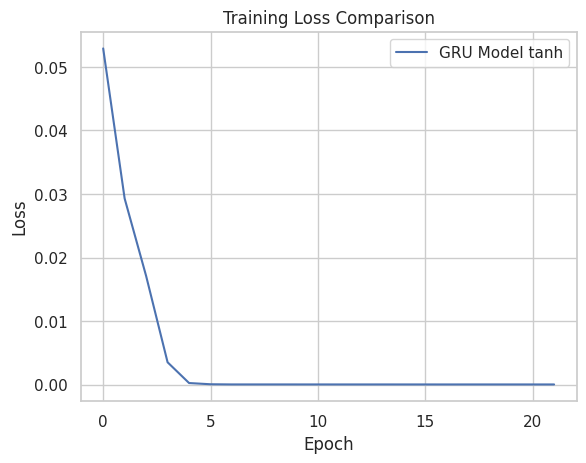

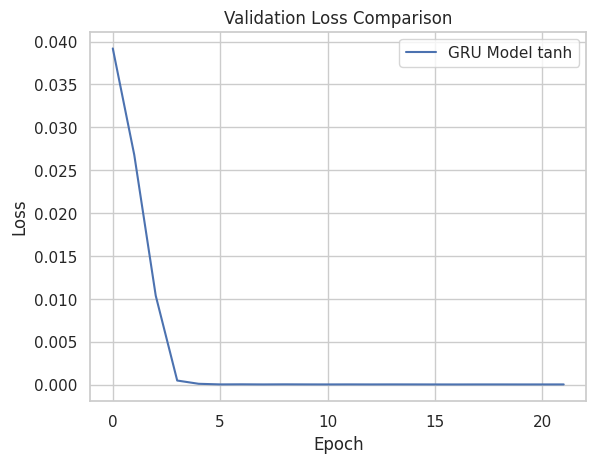

In [3543]:
# Compare the training loss of each model

plt.plot(history_with_kalman['loss'], label='GRU Model tanh')

plt.title('Training Loss Comparison')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Compare the validation loss of each model

plt.plot(history_with_kalman['val_loss'], label='GRU Model tanh')

plt.title('Validation Loss Comparison')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

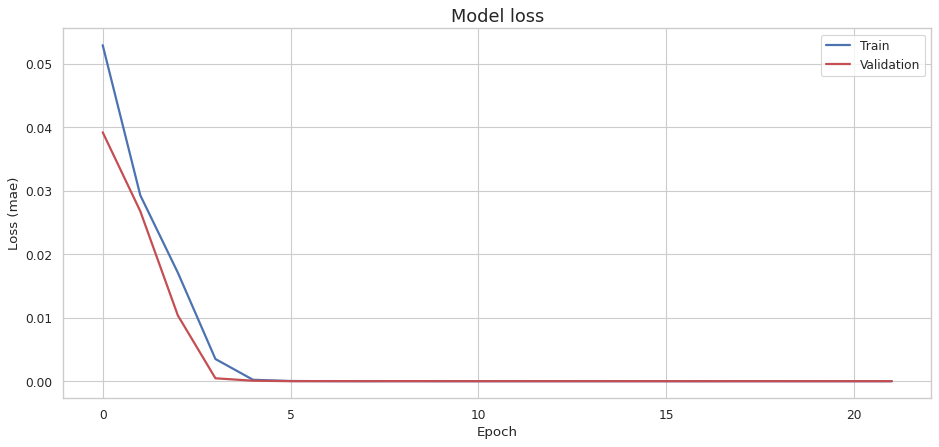

In [3544]:
#history=history4
#model=model4

#history=history_cnn_gru
#model=model_cnn_gru

history = history_with_kalman
model = model_with_kalman
# plot the training losses
fig, ax = plt.subplots(figsize=(14, 6), dpi=80)
ax.plot(history['loss'], 'b', label='Train', linewidth=2)
ax.plot(history['val_loss'], 'r', label='Validation', linewidth=2)
ax.set_title('Model loss', fontsize=16)
ax.set_ylabel('Loss (mae)')
ax.set_xlabel('Epoch')
ax.legend(loc='upper right')
plt.show()

In [3545]:
# prompt: X_train'e ait mae mse ve rmse değerleri

from sklearn.metrics import mean_absolute_error, mean_squared_error
from math import sqrt
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

if model == model_with_kalman:
# Assuming X_train is your training data and model is your trained model
    X_train_pred = model.predict(X_train)

    # Calculate MAE, MSE, and RMSE for X_train
    # Reshape to (samples, features) while considering the timesteps
    y_ttrue = X_train.reshape(X_train.shape[0], -1)
    y_tpred = X_train_pred[:, -1, :].reshape(X_train_pred.shape[0], -1)  # Use only the last timestep of predictions

    tmae = mean_absolute_error(y_ttrue, y_tpred)
    tmse = mean_squared_error(y_ttrue, y_tpred)
    trmse = np.sqrt(mse)
    tmape = mean_absolute_percentage_error(y_ttrue, y_tpred)
    tr2 = r2_score(y_ttrue, y_tpred)

    print(f"MAE: {tmae}")
    print(f"MSE: {tmse}")
    print(f"RMSE: {trmse}")
    print(f"MAPE: {tmape}")
    print(f"R2: {tr2}")

387/387 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step
MAE: 1.6799155499543627e-05
MSE: 1.0725074250846066e-09
RMSE: 0.00012155777360838069
MAPE: 2474862968.256179
R2: 0.9999999780257837


In [3546]:
# prompt: # prompt: bu model ile prediction yap mae mse rmse mape ve r2 hesapla

from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

if model == model_with_kalman:
    X_pred = model.predict(X_test)

    # Reshape to (samples, features) while considering the timesteps
    y_true = X_test.reshape(X_test.shape[0], -1)
    y_pred = X_pred[:, -1, :].reshape(X_pred.shape[0], -1)  # Use only the last timestep of predictions

    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)

    print(f"MAE: {mae}")
    print(f"MSE: {mse}")
    print(f"RMSE: {rmse}")
    print(f"MAPE: {mape}")
    print(f"R2: {r2}")

342/342 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
MAE: 2.20107983299128e-05
MSE: 2.2262870935033467e-09
RMSE: 4.718354685166585e-05
MAPE: 4789925569.166062
R2: 0.9999999501177185


In [3547]:
coff_th=mae/tmae
coff_th

1.3102324298689154

In [3548]:
# prompt: # prompt: bu model ile prediction yap mae mse rmse mape ve r2 hesapla

from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

if model == model_cnn_gru:
    X_pred = model.predict(X_test)

    # Reshape to (samples, features) while considering the timesteps
    y_true = X_test.reshape(X_test.shape[0], -1)
    y_pred = X_pred[:, -1, :].reshape(X_pred.shape[0], -1)  # Use only the last timestep of predictions

    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)

    print(f"MAE: {mae}")
    print(f"MSE: {mse}")
    print(f"RMSE: {rmse}")
    print(f"MAPE: {mape}")
    print(f"R2: {r2}")

In [3549]:
# prompt: y_true invers scaler
results3_data = []
if model == model_cnn_gru:
    X_pred = model.predict(X_test)

    # Reshape to (samples, features) while considering the timesteps
    y_true = X_test.reshape(X_test.shape[0], -1)
    y_pred = X_pred[:, -1, :].reshape(X_pred.shape[0], -1)  # Use only the last timestep of predictions

    y_true_original = scaler.inverse_transform(y_true)  # Inverse transform y_true
    y_pred_original = scaler.inverse_transform(y_pred)  # Inverse transform y_pred

    mae = mean_absolute_error( y_true_original,  y_pred_original)
    mse = mean_squared_error( y_true_original,  y_pred_original)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error( y_true_original,  y_pred_original)
    r2 = r2_score( y_true_original,  y_pred_original)

    print(f"  MAE: {mae}")
    print(f"  MSE: {mse}")
    print(f"  RMSE: {rmse}")
    print(f"  MAPE: {mape}")
    print(f"  R2: {r2}")

In [3617]:
# plot the loss distribution of the training set


X_pred = model.predict(X_train)

if model == model4:
    X_pred = X_pred.reshape(X_pred.shape[0], X_pred.shape[2])
else:
    X_pred = X_pred[:, -1, :]
    X_pred = X_pred.reshape(X_pred.shape[0], -1)

X_pred = pd.DataFrame(X_pred, columns=train.columns)
X_pred.index = train.index

scored = pd.DataFrame(index=train.index)
if model == model4:
    Xtrain = X_train.reshape(X_train.shape[0], X_train.shape[2])
else:
    Xtrain = X_train[:, -1, :]
    Xtrain = Xtrain.reshape(X_train.shape[0], -1)
scored['Loss_mae'] = np.mean(np.abs(X_pred-Xtrain), axis = 1)

387/387 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


In [3618]:
features

,feature
1,WEC: max. windspeed
2,WEC: min. windspeed
10,WEC: max. reactive Power
7,WEC: max. Power
4,WEC: max. Rotation
9,WEC: ava. reactive Power
37,Rotor temp. 2
6,WEC: ava. Power
38,Stator temp. 1
53,Inverter std dev


Otomatik olarak belirlenen eşik değeri: 3.87733056789408e-05


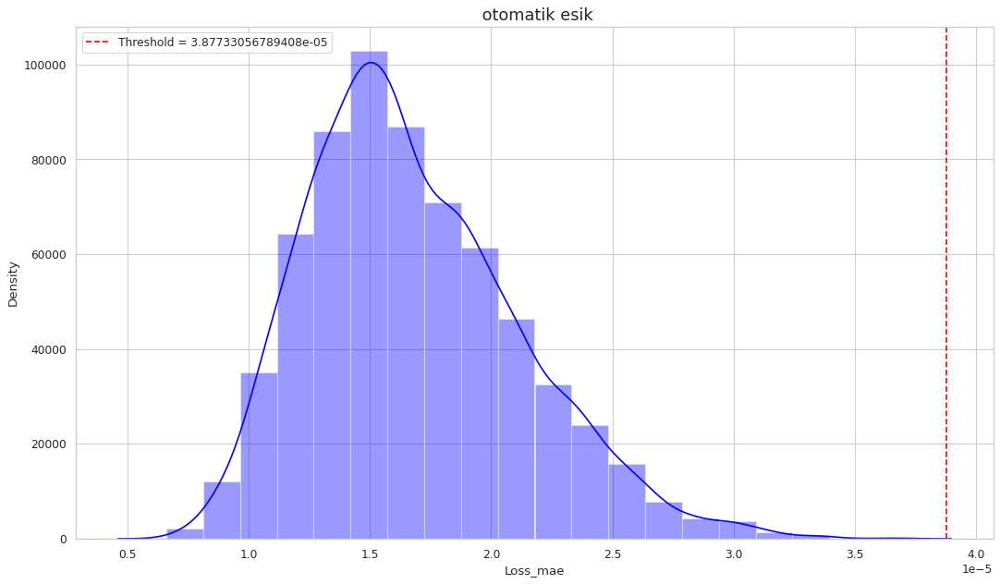

In [3619]:
# Kayıp değerlerini alın
loss_values = scored['Loss_mae'].values

# Kayıp değerlerinin z-skorlarını hesaplayın
z_scores = (loss_values - np.mean(loss_values)) / np.std(loss_values)

# Eşik değeri için bir z-score belirleyin
threshold_z_score = 5 # Örnek olarak, 3.0 z-score'u kullanıyoruz

# Eşik değeri hesaplayın
threshold_value = np.mean(loss_values) + threshold_z_score * np.std(loss_values)

# Eşik değeri görselleştirin
plt.figure(figsize=(16, 9), dpi=80)
plt.title(' otomatik esik', fontsize=16)
sns.distplot(scored['Loss_mae'], bins=20, kde=True, color='blue')
plt.axvline(x=threshold_value, color='red', linestyle='--', label=f'Threshold = {threshold_value}')
plt.legend()


# Eşik değerini ve tespit edilen anomalileri yazdırın
print(f"Otomatik olarak belirlenen eşik değeri: {threshold_value}")

In [3620]:
threshold_value

3.87733056789408e-05

In [3621]:
import numpy as np
from sklearn.metrics import f1_score

def optimize_threshold(y_true, y_scores, start=threshold_value/2, end=threshold_value*2, step=threshold_value/20):
    best_threshold = start
    best_f1_score = 0

    # Eşik değerleri üzerinde dolaşarak her biri için F1 skorunu hesapla
    thresholds = np.arange(start, end, step)
    for threshold in thresholds:
        # Tahminleri oluştur
        y_pred = [1 if score > threshold else 0 for score in y_scores]
        # Mevcut eşik değeri için F1 skorunu hesapla
        current_f1_score = f1_score(y_true, y_pred)

        # F1 skoru önceki en iyiden büyükse güncelle
        if current_f1_score > best_f1_score:
            best_f1_score = current_f1_score
            best_threshold = threshold

    return best_threshold, best_f1_score

# Gerçek etiketler ve anomali skorlarını alın
y_scores = scored['Loss_mae'].values  # Anomali skorları
y_true = trainhy['Fault'].values      # Gerçek etiketler

# Optimal eşik değerini ve en iyi F1 skorunu bul
optimal_threshold, optimal_f1_score = optimize_threshold(y_true, y_scores)

if optimal_f1_score==0:
    threshold_value = scored['Loss_mae'].max()*1.1
else:
    threshold_value = optimal_threshold

# Sonuçları yazdır
print(f"Optimal Threshold: {threshold_value}")
print(f"Optimal F1 Score: {optimal_f1_score}")


Optimal Threshold: 4.0677103235642e-05
Optimal F1 Score: 0


In [3622]:
"""
from sklearn.metrics import confusion_matrix, f1_score, precision_score, recall_score, accuracy_score

def calculate_metrics(y_true, y_pred):
    # Confusion matrix ile Ntp, Nfp, Ntn, Nfn hesaplanır
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()

    # Metrikler hesaplanır
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    accuracy = (tp + tn) / (tp + tn + fp + fn)
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

    # Sonuçları yazdırma
    print(f"Ntp (Doğru Pozitif): {tp}")
    print(f"Nfp (Yanlış Pozitif): {fp}")
    print(f"Ntn (Doğru Negatif): {tn}")
    print(f"Nfn (Yanlış Negatif): {fn}")
    print(f"Precision (Hassasiyet): {precision}")
    print(f"Recall (Duyarlılık): {recall}")
    print(f"Accuracy (Doğruluk): {accuracy}")
    print(f"F1 Score: {f1}")

# Örnek tahminler ve gerçek değerler
y_true = trainhy['Fault'].values  # Gerçek etiketler
y_pred = predict_anomalies(y_scores, threshold_value)  # Tahmin edilen etiketler

# Metrikleri hesapla
calculate_metrics(y_true, y_pred)
"""

'\nfrom sklearn.metrics import confusion_matrix, f1_score, precision_score, recall_score, accuracy_score\n\ndef calculate_metrics(y_true, y_pred):\n    # Confusion matrix ile Ntp, Nfp, Ntn, Nfn hesaplanır\n    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()\n    \n    # Metrikler hesaplanır\n    precision = tp / (tp + fp) if (tp + fp) > 0 else 0\n    recall = tp / (tp + fn) if (tp + fn) > 0 else 0\n    accuracy = (tp + tn) / (tp + tn + fp + fn)\n    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0\n\n    # Sonuçları yazdırma\n    print(f"Ntp (Doğru Pozitif): {tp}")\n    print(f"Nfp (Yanlış Pozitif): {fp}")\n    print(f"Ntn (Doğru Negatif): {tn}")\n    print(f"Nfn (Yanlış Negatif): {fn}")\n    print(f"Precision (Hassasiyet): {precision}")\n    print(f"Recall (Duyarlılık): {recall}")\n    print(f"Accuracy (Doğruluk): {accuracy}")\n    print(f"F1 Score: {f1}")\n\n# Örnek tahminler ve gerçek değerler\ny_true = trainhy[\'Fault\'].values  # Ge

In [3623]:
# prompt: trainhy verisetini arıza ve eşik değeri ile birlikte göster

# Eşik değerini ve arızaları içeren bir DataFrame oluşturun
anomaly_df = pd.DataFrame({'Loss_mae': scored['Loss_mae'], 'Fault': trainhy['Fault']})

# Eşik değerini DataFrame'e ekleyin
anomaly_df['Threshold'] = threshold_value

# DataFrame'i yazdırın
anomaly_df

,Loss_mae,Fault,Threshold
DateTime_x,,,
2014-06-08 20:10:00,0.000018,0,0.000041
2014-06-08 20:21:00,0.000018,0,0.000041
2014-06-08 21:20:00,0.000019,0,0.000041
2014-06-09 18:40:00,0.000019,0,0.000041
2014-06-09 18:49:00,0.000019,0,0.000041
...,...,...,...
2014-10-07 18:19:00,0.000030,0,0.000041
2014-10-07 18:30:00,0.000027,0,0.000041
2014-10-07 18:40:00,0.000027,0,0.000041


In [3624]:
# prompt: loss_mae DatetimeX grafiğini çiz, gerçek arıza noktalarını ve tresholdu plotly ile göster

import plotly.graph_objects as go

# Assuming you have 'scored' DataFrame with 'Loss_mae' and 'DatetimeX' (replace with your actual column name)
# and 'trainhy' DataFrame with 'Fault' and 'DatetimeX' (replace with your actual column name)

fig = go.Figure()

# Add the 'Loss_mae' trace
fig.add_trace(go.Scatter(x=scored.index, y=scored['Loss_mae'], mode='lines', name='Loss_mae'))

# Add the 'Threshold' trace
fig.add_trace(go.Scatter(x=scored.index, y=[threshold_value] * len(scored.index), mode='lines', name='Threshold', line=dict(color='red', dash='dash')))

# Add the actual fault points as markers
fig.add_trace(go.Scatter(x=trainhy[trainhy['Fault'] == 1].index, y=scored.loc[trainhy[trainhy['Fault'] == 1].index]['Loss_mae'], mode='markers', name='Actual Faults', marker=dict(color='green')))


fig.update_layout(
    title='TRAIN Loss_mae vs DatetimeX with Threshold and Actual Faults',
    xaxis_title='DatetimeX',
    yaxis_title='Loss_mae'
)

fig.show()

In [3625]:
# plot the loss distribution of the training set
"""

X_pred = model.predict(X_train)
  # Son zaman adımının tahminlerini seçin
if model == model4:
  X_pred = X_pred.reshape(X_pred.shape[0], X_pred.shape[2])
else:
  X_pred = X_pred[:, -1, :]
  X_pred = X_pred.reshape(X_pred.shape[0], -1)
  # X_pred'i 2 boyutlu hale getirin

X_pred = pd.DataFrame(X_pred, columns=train.columns)
X_pred.index = train.index

scored = pd.DataFrame(index=train.index)

if model == model4:
    Xtrain = X_train.reshape(X_train.shape[0], X_train.shape[2])
else:
    Xtrain = X_train[:, -1, :]
    Xtrain = Xtrain.reshape(X_train.shape[0], -1)
scored['Loss_mae'] = np.mean(np.abs(X_pred-Xtrain), axis = 1)
"""

"\n\nX_pred = model.predict(X_train)\n  # Son zaman adımının tahminlerini seçin\nif model == model4:\n  X_pred = X_pred.reshape(X_pred.shape[0], X_pred.shape[2])\nelse:\n  X_pred = X_pred[:, -1, :]\n  X_pred = X_pred.reshape(X_pred.shape[0], -1)\n  # X_pred'i 2 boyutlu hale getirin\n\nX_pred = pd.DataFrame(X_pred, columns=train.columns)\nX_pred.index = train.index\n\nscored = pd.DataFrame(index=train.index)\n\nif model == model4:\n    Xtrain = X_train.reshape(X_train.shape[0], X_train.shape[2])\nelse:\n    Xtrain = X_train[:, -1, :]\n    Xtrain = Xtrain.reshape(X_train.shape[0], -1)\nscored['Loss_mae'] = np.mean(np.abs(X_pred-Xtrain), axis = 1)\n"

In [3626]:
X_pred = model.predict(X_test)

if model == model4:
  X_pred = X_pred.reshape(X_pred.shape[0], X_pred.shape[2])
else:
  X_pred = X_pred[:, -1, :]
  X_pred = X_pred.reshape(X_pred.shape[0], -1)

X_pred = pd.DataFrame(X_pred, columns=test.columns)
X_pred.index = test.index

scored= pd.DataFrame(index=test.index)
if model == model4:
  Xtest = X_test.reshape(X_test.shape[0], X_test.shape[2])
else:
  Xtest = X_test[:, -1, :]
  Xtest = X_test.reshape(X_pred.shape[0], -1)

scored['Loss_mae'] = np.mean(np.abs(X_pred-Xtest), axis = 1)

342/342 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


In [3627]:
X_pred

,WEC: max. windspeed,WEC: min. windspeed,WEC: max. reactive Power,WEC: max. Power,WEC: max. Rotation,WEC: ava. reactive Power,Rotor temp. 2,WEC: ava. Power,Stator temp. 1,Inverter std dev,...,WEC: ava. Power_rolling_max,WEC: ava. Power_rolling_min,Stator temp. 1_rolling_mean,Stator temp. 1_rolling_std,Stator temp. 1_rolling_max,Stator temp. 1_rolling_min,Inverter std dev_rolling_mean,Inverter std dev_rolling_std,Inverter std dev_rolling_max,Inverter std dev_rolling_min
DateTime_x,,,,,,,,,,,,,,,,,,,,,
2014-10-08 00:49:00,0.732143,0.925946,0.584342,0.678361,0.811386,0.905255,0.962940,0.903163,0.872662,0.350086,...,0.984978,0.007006,0.724590,0.715217,0.930243,0.153581,0.202595,0.458947,0.607029,-0.000025
2014-10-08 02:10:00,0.767858,0.617282,0.457833,0.580304,0.747067,0.673682,0.925896,0.590194,0.872649,0.350092,...,0.984974,0.007004,0.733540,0.693697,0.930239,0.153560,0.193666,0.427770,0.606996,-0.000029
2014-10-08 05:20:00,0.732143,0.506159,0.518076,0.652014,0.792069,0.705261,0.962925,0.624093,0.854481,0.376291,...,0.984972,0.007002,0.741988,0.670054,0.930240,0.153555,0.183321,0.390022,0.606986,-0.000029
2014-10-08 05:29:00,0.535714,0.469127,0.325301,0.339194,0.594875,0.473686,0.740728,0.288728,0.745416,0.107725,...,0.984969,0.007005,0.750421,0.645020,0.930235,0.153543,0.174484,0.348950,0.606949,-0.000031
2014-10-08 05:40:00,0.687500,0.555551,0.391567,0.512617,0.702043,0.568421,0.666683,0.518158,0.690913,0.247437,...,0.984974,0.007002,0.759392,0.619111,0.930237,0.153542,0.165671,0.303714,0.595722,-0.000030
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-04-08 23:20:00,0.285714,0.271597,0.228916,0.100990,0.274398,0.326318,0.518515,0.088981,0.309112,0.796597,...,0.306050,0.001415,0.271612,0.389534,0.372086,0.076861,0.918366,0.574657,0.756234,0.423217
2015-04-08 23:30:00,0.294643,0.358025,0.234940,0.069526,0.237971,0.336844,0.481486,0.077479,0.309111,0.788941,...,0.306051,0.001415,0.271610,0.389534,0.372086,0.076856,0.918365,0.574658,0.756235,0.423218
2015-04-08 23:39:00,0.392858,0.320983,0.240964,0.120017,0.427621,0.347370,0.481491,0.098665,0.309117,0.780515,...,0.306052,0.001415,0.271604,0.389530,0.372087,0.076864,0.918368,0.574657,0.756235,0.423217


In [3628]:
Xtest

array([[0.73214286, 0.92592588, 0.58433735, ..., 0.45891711, 0.60697997,
        0.        ],
       [0.76785711, 0.61728392, 0.45783133, ..., 0.42773994, 0.60697997,
        0.        ],
       [0.73214286, 0.5061728 , 0.51807229, ..., 0.38998873, 0.60697997,
        0.        ],
       ...,
       [0.39285713, 0.32098763, 0.24096386, ..., 0.57464574, 0.75621418,
        0.42319187],
       [0.38392857, 0.33333332, 0.25301205, ..., 0.57464574, 0.75621418,
        0.42319187],
       [0.33035715, 0.40740738, 0.25903614, ..., 0.57464574, 0.75621418,
        0.42319187]])

In [3629]:
threshold_value

4.0677103235642e-05

In [3630]:
# prompt: plotly ile çiz ve threshold çizgisini ve gerçek arıza noktalarını yerleştir

import plotly.graph_objects as go
scored_test=scored.copy()
scored_test['Fault']=testhy['Fault']
# Calculate the exponential moving average (EMA)
window = 2# Adjust the window size as needed
scored_test['EMA'] = scored_test['Loss_mae'].ewm(span=window, adjust=False).mean()

# Create a figure
fig = go.Figure()

# Add the loss values as a scatter plot
fig.add_trace(go.Scatter(
    x=scored_test.index,
    y=scored_test['Loss_mae'],
    mode='lines',
    name='Loss'
))

# Add the EMA as a line plot
fig.add_trace(go.Scatter(
    x=scored_test.index,
    y=scored_test['EMA'],
    mode='lines',
    name='EMA'
))

# Add the threshold line
fig.add_shape(
    type="line",
    x0=scored_test.index.min(),
    x1=scored_test.index.max(),
    y0=threshold_value,
    y1=threshold_value,
    line=dict(
        color="red",
        dash="dash",
    )
)

# Add the actual fault points
fault_indices = testhy[testhy['Fault'] == 1].index
fig.add_trace(go.Scatter(
    x=fault_indices,
    y=scored_test.loc[fault_indices]['Loss_mae'],
    mode='markers',
    name='Actual Faults',
    marker=dict(
        color='green',
        size=8
    )
))

# Set the layout
fig.update_layout(
    title="Test Data Loss over Time with Threshold and Actual Faults",
    xaxis_title="Time",
    yaxis_title="Loss",
    showlegend=True
)

# Display the plot
fig.show()


In [3631]:
# prompt: eşiğin aşıldığı  zamanları tarih bilgisiyle birlikte kesikli çizgilerle grafikte göster göster

import plotly.graph_objects as go

# ... (Your existing code) ...

# Create a figure
fig = go.Figure()




# Add the loss values as a scatter plot
fig.add_trace(go.Scatter(
    x=scored_test.index,
    y=scored_test['Loss_mae'],
    mode='lines',
    name='Loss'
))

# Add the EMA as a line plot
fig.add_trace(go.Scatter(
    x=scored_test.index,
    y=scored_test['EMA'],
    mode='lines',
    name='EMA'
))

# Add the threshold line
fig.add_shape(
    type="line",
    x0=scored_test.index.min(),
    x1=scored_test.index.max(),
    y0=threshold_value,
    y1=threshold_value,
    line=dict(
        color="red",
        dash="dash",
    )
)


# Find the time points where the threshold is exceeded
threshold_exceeded_indices = scored_test[scored_test['Loss_mae'] > threshold_value].index

# Add vertical lines for threshold exceedances
for index in threshold_exceeded_indices:
  fig.add_shape(
      type="line",
      x0=index,
      x1=index,
      y0=0,
      y1=scored_test['Loss_mae'].max(),
      line=dict(
          color="black",
          dash="dash",
      )
  )

# Add the actual fault points
fault_indices = testhy[testhy['Fault'] == 1].index
fig.add_trace(go.Scatter(
    x=fault_indices,
    y=scored_test.loc[fault_indices]['Loss_mae'],
    mode='markers',
    name='Actual Faults',
    marker=dict(
        color='green',
        size=8
    )
))

# Set the layout
fig.update_layout(
    title="Test Data Loss over Time with Threshold and Actual Faults",
    xaxis_title="Time",
    yaxis_title="Loss",
    showlegend=True
)

# Display the plot
fig.show()


In [3632]:
# prompt: eşiğin aşılma zamanlarını göster

# Find the time points where the threshold is exceeded
threshold_exceeded_indices = scored_test[scored_test['Loss_mae'] > threshold_value].index

# Print the time points
print("Eşik Değerini Aşan Zaman Noktaları:")
for index in threshold_exceeded_indices:
  print(index)

Eşik Değerini Aşan Zaman Noktaları:
2014-10-15 22:50:00
2014-10-17 06:09:00
2014-10-17 06:20:00
2014-10-17 06:29:00
2014-10-17 11:49:00
2014-10-19 18:00:00
2014-10-19 18:49:00
2014-10-19 19:00:00
2014-10-19 19:10:00
2014-10-19 19:19:00
2014-10-19 19:29:00
2014-10-19 19:40:00
2014-10-19 19:49:00
2014-10-19 19:59:00
2014-10-19 20:10:00
2014-10-19 20:18:00
2014-10-19 20:29:00
2014-10-19 20:40:00
2014-10-19 20:50:00
2014-10-19 20:59:00
2014-10-19 21:10:00
2014-10-19 21:20:00
2014-10-19 21:50:00
2014-10-19 21:59:00
2014-10-19 22:09:00
2014-10-19 22:20:00
2014-10-19 22:29:00
2014-10-19 22:39:00
2014-10-19 22:50:00
2014-10-19 23:01:00
2014-10-19 23:09:00
2014-10-19 23:20:00
2014-10-19 23:30:00
2014-10-19 23:39:00
2014-10-19 23:50:00
2014-10-20 00:00:00
2014-10-20 02:00:00
2014-10-20 02:10:00
2014-10-20 02:19:00
2014-10-20 02:30:00
2014-10-24 20:21:00
2014-10-24 20:29:00
2014-10-24 20:40:00
2014-10-24 20:50:00
2014-10-24 20:59:00
2014-10-24 21:10:00
2014-10-24 21:20:00
2014-10-24 21:29:00
2014

In [3633]:
# prompt: doğru negatifleri de kullan

# ... (Your existing code) ...

# Gerçek arızaları ve tespit edilen arızaları karşılaştır
true_positives = 0
false_positives = 0
false_negatives = 0
true_negatives = 0  # Doğru negatifleri hesaplamak için değişken

for index, row in scored_test.iterrows():
    if row['Fault'] == 1 and row['Loss_mae'] > threshold_value:
        true_positives += 1
    elif row['Fault'] == 0 and row['Loss_mae'] > threshold_value:
        false_positives += 1
    elif row['Fault'] == 1 and row['Loss_mae'] <= threshold_value:
        false_negatives += 1
    elif row['Fault'] == 0 and row['Loss_mae'] <= threshold_value:
        true_negatives += 1  # Doğru negatifleri say

# Doğruluk, hassasiyet, geri çağırma ve F1 puanını hesapla
if true_positives + false_positives > 0:
    precision = true_positives / (true_positives + false_positives)
else:
    precision = 0

if true_positives + false_negatives > 0:
    recall = true_positives / (true_positives + false_negatives)
else:
    recall = 0

if precision + recall > 0:
    f1_score = 2 * (precision * recall) / (precision + recall)
else:
    f1_score = 0

accuracy = (true_positives + true_negatives) / len(scored_test)

# Sonuçları yazdır
print("Doğru Pozitifler:", true_positives)
print("Yanlış Pozitifler:", false_positives)
print("Yanlış Negatifler:", false_negatives)
print("Doğru Negatifler:", true_negatives)  # Doğru negatifleri yazdır
print("Hassasiyet:", precision)
print("Geri Çağırma:", recall)
print("F1 Puanı:", f1_score)
print("Doğruluk:", accuracy)

Doğru Pozitifler: 3
Yanlış Pozitifler: 237
Yanlış Negatifler: 0
Doğru Negatifler: 10703
Hassasiyet: 0.0125
Geri Çağırma: 1.0
F1 Puanı: 0.02469135802469136
Doğruluk: 0.9783423192908709


In [3652]:
# prompt: Doğru Pozitifler:
# Yanlış Pozitifler:
# Yanlış Negatifler:
# Doğru Negatifler:         değerlerini manuel gir ve metrikleri hesapla

# Değerleri manuel olarak girin
true_positives = 3
false_positives = 0
false_negatives = 0
true_negatives = true_negatives

# Hassasiyet hesapla
if true_positives + false_positives > 0:
  precision = true_positives / (true_positives + false_positives)
else:
  precision = 0

# Geri çağırma hesapla
if true_positives + false_negatives > 0:
  recall = true_positives / (true_positives + false_negatives)
else:
  recall = 0

# F1 puanı hesapla
if precision + recall > 0:
  f1_score = 2 * (precision * recall) / (precision + recall)
else:
  f1_score = 0

# Doğruluk hesapla
accuracy = (true_positives + true_negatives) / (true_positives + false_positives + false_negatives + true_negatives)


# Sonuçları yazdır
print("Doğru Pozitifler:", true_positives)
print("Yanlış Pozitifler:", false_positives)
print("Yanlış Negatifler:", false_negatives)
print("Doğru Negatifler:", true_negatives)
print("Hassasiyet:", precision)
print("Geri Çağırma:", recall)
print("F1 Puanı:", f1_score)
print("Doğruluk:", accuracy)

Doğru Pozitifler: 3
Yanlış Pozitifler: 0
Yanlış Negatifler: 0
Doğru Negatifler: 10703
Hassasiyet: 1.0
Geri Çağırma: 1.0
F1 Puanı: 1.0
Doğruluk: 1.0


In [3635]:
# prompt: yukarıdaki modeli kullanarak predicition yap

# Make predictions on the test data

X_pred = model.predict(X_test)

    # Reshape the predictions
if model==model4:
        X_pred = X_pred.reshape(X_pred.shape[0], X_pred.shape[2])

else:
        X_pred = X_pred[:, -1, :]
        X_pred = X_pred.reshape(X_pred.shape[0], -1)


    # Convert predictions to a DataFrame
X_pred = pd.DataFrame(X_pred, columns=test.columns)
X_pred.index = test.index

    # Calculate the reconstruction loss
scored = pd.DataFrame(index=test.index)
if model==model4:

   Xtest = X_test.reshape(X_test.shape[0], X_test.shape[2])
else:
   Xtest = X_test[:, -1, :]
   Xtest = Xtest.reshape(X_test.shape[0], -1)

scored['Loss_mae'] = np.mean(np.abs(X_pred - Xtest), axis=1)

    # Add the actual fault values to the scored DataFrame
scored['Fault'] = testhy['Fault']

    # Calculate the EMA (Exponential Moving Average)
window = 50  # Adjust the window size as needed
scored['EMA'] = scored['Loss_mae'].ewm(span=window, adjust=False).mean()

    # Identify anomalies based on the threshold
anomalies = scored[scored['Loss_mae'] > threshold_value]

    # Print the anomalies
print("Anomalies:")
print(anomalies)


342/342 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Anomalies:
                     Loss_mae  Fault       EMA
DateTime_x                                    
2014-10-15 22:50:00  0.000042      0  0.000025
2014-10-17 06:09:00  0.000041      0  0.000035
2014-10-17 06:20:00  0.000041      0  0.000035
2014-10-17 06:29:00  0.000043      0  0.000035
2014-10-17 11:49:00  0.000055      1  0.000036
...                       ...    ...       ...
2015-01-09 04:29:00  0.000051      0  0.000052
2015-01-09 04:40:00  0.000051      0  0.000052
2015-01-09 04:50:00  0.000052      0  0.000052
2015-01-09 04:59:00  0.000051      0  0.000052
2015-01-10 16:49:00  0.000049      0  0.000052

[240 rows x 3 columns]


In [3636]:
Xtest

array([[0.73214286, 0.92592588, 0.58433735, ..., 0.45891711, 0.60697997,
        0.        ],
       [0.76785711, 0.61728392, 0.45783133, ..., 0.42773994, 0.60697997,
        0.        ],
       [0.73214286, 0.5061728 , 0.51807229, ..., 0.38998873, 0.60697997,
        0.        ],
       ...,
       [0.39285713, 0.32098763, 0.24096386, ..., 0.57464574, 0.75621418,
        0.42319187],
       [0.38392857, 0.33333332, 0.25301205, ..., 0.57464574, 0.75621418,
        0.42319187],
       [0.33035715, 0.40740738, 0.25903614, ..., 0.57464574, 0.75621418,
        0.42319187]])

In [3637]:
# prompt: feature selection sütunlarını göster
selected_features_xgb

,feature
1,WEC: max. windspeed
2,WEC: min. windspeed
10,WEC: max. reactive Power
7,WEC: max. Power
4,WEC: max. Rotation
9,WEC: ava. reactive Power
37,Rotor temp. 2
6,WEC: ava. Power
38,Stator temp. 1
53,Inverter std dev


In [3638]:
import plotly.graph_objects as go

# Assuming 'scaler1' is the MinMaxScaler object used for scaling
X_pred_original = scaler.inverse_transform(X_pred)
Xtest_original = scaler.inverse_transform(Xtest)

# Create a DataFrame with the original values
X_pred_org = pd.DataFrame(X_pred_original, columns=test.columns, index=test.index)
Xtest_org = pd.DataFrame(Xtest_original, columns=test.columns, index=test.index)

# Select a few features for visualization
features_to_plot = my_tuple

# Create subplots for each selected feature
for feature in features_to_plot:
  fig = go.Figure()

  # Plot X_pred values
  fig.add_trace(go.Scatter(
      x=X_pred_org.index,
      y=X_pred_org[feature],
      mode='lines',
      name='X_pred',
      line=dict(color='blue')
  ))

  # Plot X_test values
  fig.add_trace(go.Scatter(
      x=X_pred_org.index,
      y=Xtest_org[feature],  # Use the column name directly to access the values
      mode='lines',
      name='X_test',
      line=dict(color='red')
  ))

      # Add the threshold line
  fig.add_shape(
      type="line",
      x0=scored_test.index.min(),
      x1=scored_test.index.max(),
      y0=threshold_value,
      y1=threshold_value,
      line=dict(
          color="red",
          dash="dash"
  ))

  fig.update_layout(
      title=f"Comparison of {feature} between X_pred and X_test",
      xaxis_title="Time",
      yaxis_title=feature,
      showlegend=True
  )

  fig.show()

In [3639]:
data_af

,WEC: max. windspeed,WEC: min. windspeed,WEC: max. reactive Power,WEC: max. Power,WEC: max. Rotation,WEC: ava. reactive Power,Rotor temp. 2,WEC: ava. Power,Stator temp. 1,Inverter std dev,...,WEC: ava. Power_rolling_min,Stator temp. 1_rolling_mean,Stator temp. 1_rolling_std,Stator temp. 1_rolling_max,Stator temp. 1_rolling_min,Inverter std dev_rolling_mean,Inverter std dev_rolling_std,Inverter std dev_rolling_max,Inverter std dev_rolling_min,Fault
DateTime_x,,,,,,,,,,,,,,,,,,,,,
2014-06-08 20:10:00,12.8,4.2,24.0,1589.0,12.66,9.0,55.0,873.0,71.0,1.328020,...,215.0,64.89,3.097392,74.0,59.0,1.293739,0.525618,2.932576,0.522233,0
2014-06-08 20:21:00,11.5,4.8,29.0,2244.0,13.76,8.0,53.0,1005.0,69.0,1.221028,...,215.0,64.89,3.097392,74.0,59.0,1.293739,0.525618,2.932576,0.522233,0
2014-06-08 21:20:00,10.3,5.0,16.0,1953.0,13.36,5.0,53.0,1050.0,71.0,1.286291,...,215.0,64.89,3.097392,74.0,59.0,1.293739,0.525618,2.932576,0.522233,0
2014-06-09 18:40:00,10.3,4.6,22.0,1732.0,13.00,5.0,59.0,1095.0,74.0,1.300350,...,215.0,64.89,3.097392,74.0,59.0,1.293739,0.525618,2.932576,0.522233,0
2014-06-09 18:49:00,10.8,4.3,13.0,1515.0,12.47,3.0,57.0,1123.0,72.0,1.183216,...,215.0,64.89,3.097392,74.0,59.0,1.293739,0.525618,2.932576,0.522233,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-04-08 23:20:00,5.5,2.2,42.0,277.0,7.40,34.0,47.0,147.0,46.0,3.474583,...,1.0,45.48,7.239733,57.0,32.0,2.814190,0.668845,3.635682,1.009050,0
2015-04-08 23:30:00,5.6,2.9,43.0,191.0,7.06,35.0,46.0,128.0,46.0,3.445683,...,1.0,45.48,7.239733,57.0,32.0,2.814190,0.668845,3.635682,1.009050,0
2015-04-08 23:39:00,6.7,2.6,44.0,329.0,8.83,36.0,46.0,163.0,46.0,3.413876,...,1.0,45.48,7.239733,57.0,32.0,2.814190,0.668845,3.635682,1.009050,0


In [3640]:
# prompt: data_af her bir features isimleri için ayrı ayrı  test ve train için mae mape rmse mse r2 değerlerini hesapla

from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

if model == model_cnn_gru:
    X_pred = model.predict(X_test)

    # Reshape to (samples, features) while considering the timesteps
    y_true = X_test.reshape(X_test.shape[0], -1)
    y_pred = X_pred[:, -1, :].reshape(X_pred.shape[0], -1)  # Use only the last timestep of predictions

    for feature_index in range(y_true.shape[1]):
        feature_y_true = y_true[:, feature_index]
        feature_y_pred = y_pred[:, feature_index]

        mae = mean_absolute_error(feature_y_true, feature_y_pred)
        mse = mean_squared_error(feature_y_true, feature_y_pred)
        rmse = np.sqrt(mse)
        mape = mean_absolute_percentage_error(feature_y_true, feature_y_pred)
        r2 = r2_score(feature_y_true, feature_y_pred)

        print(f"Feature {test.columns[feature_index]}")
        print(f"  MAE: {mae}")
        print(f"  MSE: {mse}")
        print(f"  RMSE: {rmse}")
        print(f"  MAPE: {mape}")
        print(f"  R2: {r2}")


if model == model_cnn_gru:
    X_pred = model.predict(X_train)

    # Reshape to (samples, features) while considering the timesteps
    y_true = X_train.reshape(X_train.shape[0], -1)
    y_pred = X_pred[:, -1, :].reshape(X_pred.shape[0], -1)  # Use only the last timestep of predictions

    for feature_index in range(y_true.shape[1]):
        feature_y_true = y_true[:, feature_index]
        feature_y_pred = y_pred[:, feature_index]

        mae = mean_absolute_error(feature_y_true, feature_y_pred)
        mse = mean_squared_error(feature_y_true, feature_y_pred)
        rmse = np.sqrt(mse)
        mape = mean_absolute_percentage_error(feature_y_true, feature_y_pred)
        r2 = r2_score(feature_y_true, feature_y_pred)

        print(f"Train Feature {train.columns[feature_index]}")
        print(f"  MAE: {mae}")
        print(f"  MSE: {mse}")
        print(f"  RMSE: {rmse}")
        print(f"  MAPE: {mape}")
        print(f"  R2: {r2}")

In [3641]:
# prompt: data_af her bir features isimleri için ayrı ayrı  test ve train için mae mape rmse mse r2 değerlerini hesapla

from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

if model == model_with_kalman:
    X_pred = model.predict(X_test)

    # Reshape to (samples, features) while considering the timesteps
    y_true = X_test.reshape(X_test.shape[0], -1)
    y_pred = X_pred[:, -1, :].reshape(X_pred.shape[0], -1)  # Use only the last timestep of predictions

    for feature_index in range(y_true.shape[1]):
        feature_y_true = y_true[:, feature_index]
        feature_y_pred = y_pred[:, feature_index]

        mae = mean_absolute_error(feature_y_true, feature_y_pred)
        mse = mean_squared_error(feature_y_true, feature_y_pred)
        rmse = np.sqrt(mse)
        mape = mean_absolute_percentage_error(feature_y_true, feature_y_pred)
        r2 = r2_score(feature_y_true, feature_y_pred)

        print(f"Feature {test.columns[feature_index]}")
        print(f"  MAE: {mae}")
        print(f"  MSE: {mse}")
        print(f"  RMSE: {rmse}")
        print(f"  MAPE: {mape}")
        print(f"  R2: {r2}")


if model == model_with_kalman:
    X_pred = model.predict(X_train)

    # Reshape to (samples, features) while considering the timesteps
    y_true = X_train.reshape(X_train.shape[0], -1)
    y_pred = X_pred[:, -1, :].reshape(X_pred.shape[0], -1)  # Use only the last timestep of predictions

    for feature_index in range(y_true.shape[1]):
        feature_y_true = y_true[:, feature_index]
        feature_y_pred = y_pred[:, feature_index]

        mae = mean_absolute_error(feature_y_true, feature_y_pred)
        mse = mean_squared_error(feature_y_true, feature_y_pred)
        rmse = np.sqrt(mse)
        mape = mean_absolute_percentage_error(feature_y_true, feature_y_pred)
        r2 = r2_score(feature_y_true, feature_y_pred)

        print(f"Train Feature {train.columns[feature_index]}")
        print(f"  MAE: {mae}")
        print(f"  MSE: {mse}")
        print(f"  RMSE: {rmse}")
        print(f"  MAPE: {mape}")
        print(f"  R2: {r2}")

342/342 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Feature WEC: max. windspeed
  MAE: 4.072979180500391e-07
  MSE: 2.6403731274193353e-13
  RMSE: 5.138456117764689e-07
  MAPE: 662319.0452365788
  R2: 0.9999999999921152
Feature WEC: min. windspeed
  MAE: 7.227362382970242e-06
  MSE: 8.273582488508515e-11
  RMSE: 9.09592353118061e-06
  MAPE: 10032907.01856636
  R2: 0.9999999968633474
Feature WEC: max. reactive Power
  MAE: 2.8922517090292954e-06
  MSE: 1.8885859240883017e-11
  RMSE: 4.34578637773223e-06
  MAPE: 6.150440163551313e-06
  R2: 0.9999999993689745
Feature WEC: max. Power
  MAE: 8.177631348937043e-06
  MSE: 1.1386225232811554e-10
  RMSE: 1.06706256765063e-05
  MAPE: 23221028.377726153
  R2: 0.9999999970189245
Feature WEC: max. Rotation
  MAE: 2.4298642688448135e-05
  MSE: 9.406169126869528e-10
  RMSE: 3.066947851997084e-05
  MAPE: 0.0001542808409415406
  R2: 0.999999980108845
Feature WEC: ava. reactive Power
  MAE: 3.3093059831262744e-06
  MSE: 1.8804864338132033e-11
  RMSE: 4.33645757942

In [3642]:
# prompt:       print(f"Train Feature {train.columns[feature_index]}")
#         print(f"  MAE: {mae}")
#         print(f"  MSE: {mse}")
#         print(f"  RMSE: {rmse}")
#         print(f"  MAPE: {mape}")
#         print(f"  R2: {r2}")     sonuçları için tablo oluştur

import pandas as pd

results_data = []

if model == model_cnn_gru:
    X_pred = model.predict(X_train)

    # Reshape to (samples, features) while considering the timesteps
    y_true = X_train.reshape(X_train.shape[0], -1)
    y_pred = X_pred[:, -1, :].reshape(X_pred.shape[0], -1)  # Use only the last timestep of predictions

    for feature_index in range(y_true.shape[1]):
        feature_y_true = y_true[:, feature_index]
        feature_y_pred = y_pred[:, feature_index]

        mae = mean_absolute_error(feature_y_true, feature_y_pred)
        mse = mean_squared_error(feature_y_true, feature_y_pred)
        rmse = np.sqrt(mse)
        mape = mean_absolute_percentage_error(feature_y_true, feature_y_pred)
        r2 = r2_score(feature_y_true, feature_y_pred)

        results_data.append([train.columns[feature_index], mae, mse, rmse, mape, r2])

results_df = pd.DataFrame(results_data, columns=['Feature', 'MAE', 'MSE', 'RMSE', 'MAPE', 'R2'])
results_df

,Feature,MAE,MSE,RMSE,MAPE,R2


In [3643]:
import pandas as pd

results_data = []

if model == model_with_kalman:
    X_pred = model.predict(X_train)

    # Reshape to (samples, features) while considering the timesteps
    y_true = X_train.reshape(X_train.shape[0], -1)
    y_pred = X_pred[:, -1, :].reshape(X_pred.shape[0], -1)  # Use only the last timestep of predictions

    for feature_index in range(y_true.shape[1]):
        feature_y_true = y_true[:, feature_index]
        feature_y_pred = y_pred[:, feature_index]

        mae = mean_absolute_error(feature_y_true, feature_y_pred)
        mse = mean_squared_error(feature_y_true, feature_y_pred)
        rmse = np.sqrt(mse)
        mape = mean_absolute_percentage_error(feature_y_true, feature_y_pred)
        r2 = r2_score(feature_y_true, feature_y_pred)

        results_data.append([train.columns[feature_index], mae, mse, rmse, mape, r2])

results_df = pd.DataFrame(results_data, columns=['Feature', 'MAE', 'MSE', 'RMSE', 'MAPE', 'R2'])
results_df

387/387 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


,Feature,MAE,MSE,RMSE,MAPE,R2
0,WEC: max. windspeed,4.530624e-07,3.109805e-13,5.576562e-07,1.172207e+06,1.0
1,WEC: min. windspeed,7.174742e-06,8.245919e-11,9.080704e-06,2.983702e+07,1.0
2,WEC: max. reactive Power,1.995105e-06,9.282397e-12,3.046703e-06,5.649388e+06,1.0
3,WEC: max. Power,7.825203e-06,1.357619e-10,1.165169e-05,1.959496e+07,1.0
4,WEC: max. Rotation,2.386206e-05,9.347829e-10,3.057422e-05,1.963990e+07,1.0
5,WEC: ava. reactive Power,2.454659e-06,1.095002e-11,3.309081e-06,1.764823e+08,1.0
6,Rotor temp. 2,2.195160e-05,7.723099e-10,2.779046e-05,1.291121e+09,1.0
7,WEC: ava. Power,4.945466e-06,4.704839e-11,6.859183e-06,9.090774e+07,1.0
8,Stator temp. 1,4.359556e-05,2.906087e-09,5.390814e-05,9.429485e+08,1.0
9,Inverter std dev,1.868137e-05,5.282152e-10,2.298293e-05,1.605273e+07,1.0


In [3644]:
X_pred

array([[[ 9.37501788e-01,  5.18514872e-01,  1.20477974e-01, ...,
          4.10756499e-01,  4.73733574e-01,  4.30304259e-02],
        [ 9.37501550e-01,  5.18511772e-01,  1.20476395e-01, ...,
          4.10750508e-01,  4.73754615e-01,  4.30269092e-02],
        [ 9.37501371e-01,  5.18508077e-01,  1.20477602e-01, ...,
          4.10746187e-01,  4.73728061e-01,  4.30174917e-02],
        [ 9.37501907e-01,  5.18510580e-01,  1.20477021e-01, ...,
          4.10756171e-01,  4.73779321e-01,  4.30222750e-02]],

       [[ 8.21429372e-01,  5.92594743e-01,  1.50599211e-01, ...,
          4.10758376e-01,  4.73753601e-01,  4.30295616e-02],
        [ 8.21429312e-01,  5.92591584e-01,  1.50596961e-01, ...,
          4.10751879e-01,  4.73773360e-01,  4.30258960e-02],
        [ 8.21429074e-01,  5.92588544e-01,  1.50598556e-01, ...,
          4.10746932e-01,  4.73742604e-01,  4.30173874e-02],
        [ 8.21429610e-01,  5.92589438e-01,  1.50597885e-01, ...,
          4.10755515e-01,  4.73783851e-01,  4.30241

In [3645]:
# prompt: y_true invers scaler
results2_data = []
if model == model_cnn_gru:
    X_pred = model.predict(X_test)

    # Reshape to (samples, features) while considering the timesteps
    y_true = X_test.reshape(X_test.shape[0], -1)
    y_pred = X_pred[:, -1, :].reshape(X_pred.shape[0], -1)  # Use only the last timestep of predictions

    y_true_original = scaler.inverse_transform(y_true)  # Inverse transform y_true
    y_pred_original = scaler.inverse_transform(y_pred)  # Inverse transform y_pred

    for feature_index in range(y_true.shape[1]):
        feature_y_true = y_true_original[:, feature_index]  # Use the original values
        feature_y_pred = y_pred_original[:, feature_index]  # Use the original values

        mae = mean_absolute_error(feature_y_true, feature_y_pred)
        mse = mean_squared_error(feature_y_true, feature_y_pred)
        rmse = np.sqrt(mse)
        mape = mean_absolute_percentage_error(feature_y_true, feature_y_pred)
        r2 = r2_score(feature_y_true, feature_y_pred)

        print(f"Feature {test.columns[feature_index]}")
        print(f"  MAE: {mae}")
        print(f"  MSE: {mse}")
        print(f"  RMSE: {rmse}")
        print(f"  MAPE: {mape}")
        print(f"  R2: {r2}")

        results2_data.append([train.columns[feature_index], mae, mse, rmse, mape, r2])

results2_df = pd.DataFrame(results2_data, columns=['Feature', 'MAE', 'MSE', 'RMSE', 'MAPE', 'R2'])
results2_df

,Feature,MAE,MSE,RMSE,MAPE,R2


In [3646]:
# prompt: y_true invers scaler
results2_data = []
if model == model_with_kalman:
    X_pred = model.predict(X_test)

    # Reshape to (samples, features) while considering the timesteps
    y_true = X_test.reshape(X_test.shape[0], -1)
    y_pred = X_pred[:, -1, :].reshape(X_pred.shape[0], -1)  # Use only the last timestep of predictions

    y_true_original = scaler.inverse_transform(y_true)  # Inverse transform y_true
    y_pred_original = scaler.inverse_transform(y_pred)  # Inverse transform y_pred

    for feature_index in range(y_true.shape[1]):
        feature_y_true = y_true_original[:, feature_index]  # Use the original values
        feature_y_pred = y_pred_original[:, feature_index]  # Use the original values

        mae = mean_absolute_error(feature_y_true, feature_y_pred)
        mse = mean_squared_error(feature_y_true, feature_y_pred)
        rmse = np.sqrt(mse)
        mape = mean_absolute_percentage_error(feature_y_true, feature_y_pred)
        r2 = r2_score(feature_y_true, feature_y_pred)

        print(f"Feature {test.columns[feature_index]}")
        print(f"  MAE: {mae}")
        print(f"  MSE: {mse}")
        print(f"  RMSE: {rmse}")
        print(f"  MAPE: {mape}")
        print(f"  R2: {r2}")

        results2_data.append([train.columns[feature_index], mae, mse, rmse, mape, r2])

results2_df = pd.DataFrame(results2_data, columns=['Feature', 'MAE', 'MSE', 'RMSE', 'MAPE', 'R2'])
results2_df

342/342 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Feature WEC: max. windspeed
  MAE: 4.555738649012996e-06
  MSE: 3.319299474744628e-11
  RMSE: 5.761336194620679e-06
  MAPE: 7.748968971741776e-07
  R2: 0.999999999992098
Feature WEC: min. windspeed
  MAE: 5.8542291557841166e-05
  MSE: 5.428131691294454e-09
  RMSE: 7.367585555183228e-05
  MAPE: 81266550.4435869
  R2: 0.9999999968634434
Feature WEC: max. reactive Power
  MAE: 0.0004794906351966268
  MSE: 5.189395601863801e-07
  RMSE: 0.0007203745971273419
  MAPE: 1731449166.2527692
  R2: 0.9999999993707681
Feature WEC: max. Power
  MAE: 0.022345776948405685
  MSE: 0.0008500837169194169
  RMSE: 0.029156195172199972
  MAPE: 118982629908.0721
  R2: 0.9999999970202788
Feature WEC: max. Rotation
  MAE: 0.00022672075271238116
  MSE: 8.188505675768251e-08
  RMSE: 0.00028615565127685754
  MAPE: 2.61903207105721e-05
  R2: 0.9999999801075355
Feature WEC: ava. reactive Power
  MAE: 0.0003143915346430938
  MSE: 1.6980027208756812e-07
  RMSE: 0.000412068285709

,Feature,MAE,MSE,RMSE,MAPE,R2
0,WEC: max. windspeed,0.000005,3.319299e-11,0.000006,7.748969e-07,1.000000
1,WEC: min. windspeed,0.000059,5.428132e-09,0.000074,8.126655e+07,1.000000
2,WEC: max. reactive Power,0.000479,5.189396e-07,0.000720,1.731449e+09,1.000000
3,WEC: max. Power,0.022346,8.500837e-04,0.029156,1.189826e+11,1.000000
4,WEC: max. Rotation,0.000227,8.188506e-08,0.000286,2.619032e-05,1.000000
5,WEC: ava. reactive Power,0.000314,1.698003e-07,0.000412,1.575252e+09,1.000000
6,Rotor temp. 2,0.000980,1.281365e-06,0.001132,2.267461e-05,1.000000
7,WEC: ava. Power,0.009392,1.313005e-04,0.011459,2.570232e+11,1.000000
8,Stator temp. 1,0.002384,8.556615e-06,0.002925,4.665049e-05,1.000000
9,Inverter std dev,0.000072,7.692993e-09,0.000088,4.226897e-05,1.000000


In [3647]:
# prompt: ilk 9 özelliğin ortalama hata metriklerini hesapla

from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

if model == model_cnn_gru:
    X_pred = model.predict(X_test)

    # Reshape to (samples, features) while considering the timesteps
    y_true = X_test.reshape(X_test.shape[0], -1)
    y_pred = X_pred[:, -1, :].reshape(X_pred.shape[0], -1)  # Use only the last timestep of predictions

    for feature_index in range(min(9, y_true.shape[1])):  # İlk 9 özellik için döngü
        feature_y_true = y_true[:, feature_index]
        feature_y_pred = y_pred[:, feature_index]

        mae = mean_absolute_error(feature_y_true, feature_y_pred)
        mse = mean_squared_error(feature_y_true, feature_y_pred)
        rmse = np.sqrt(mse)
        mape = mean_absolute_percentage_error(feature_y_true, feature_y_pred)
        r2 = r2_score(feature_y_true, feature_y_pred)

        print(f"Feature {test.columns[feature_index]}")
        print(f"  MAE: {mae}")
        print(f"  MSE: {mse}")
        print(f"  RMSE: {rmse}")
        print(f"  MAPE: {mape}")
        print(f"  R2: {r2}")

In [3648]:
# prompt: ilk 9 özelliğin ortalama hata metriklerini hesapla

from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

if model == model_with_kalman:
    X_pred = model.predict(X_test)

    # Reshape to (samples, features) while considering the timesteps
    y_true = X_test.reshape(X_test.shape[0], -1)
    y_pred = X_pred[:, -1, :].reshape(X_pred.shape[0], -1)  # Use only the last timestep of predictions

    for feature_index in range(min(9, y_true.shape[1])):  # İlk 9 özellik için döngü
        feature_y_true = y_true[:, feature_index]
        feature_y_pred = y_pred[:, feature_index]

        mae = mean_absolute_error(feature_y_true, feature_y_pred)
        mse = mean_squared_error(feature_y_true, feature_y_pred)
        rmse = np.sqrt(mse)
        mape = mean_absolute_percentage_error(feature_y_true, feature_y_pred)
        r2 = r2_score(feature_y_true, feature_y_pred)

        print(f"Feature {test.columns[feature_index]}")
        print(f"  MAE: {mae}")
        print(f"  MSE: {mse}")
        print(f"  RMSE: {rmse}")
        print(f"  MAPE: {mape}")
        print(f"  R2: {r2}")

342/342 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Feature WEC: max. windspeed
  MAE: 4.072979180500391e-07
  MSE: 2.6403731274193353e-13
  RMSE: 5.138456117764689e-07
  MAPE: 662319.0452365788
  R2: 0.9999999999921152
Feature WEC: min. windspeed
  MAE: 7.227362382970242e-06
  MSE: 8.273582488508515e-11
  RMSE: 9.09592353118061e-06
  MAPE: 10032907.01856636
  R2: 0.9999999968633474
Feature WEC: max. reactive Power
  MAE: 2.8922517090292954e-06
  MSE: 1.8885859240883017e-11
  RMSE: 4.34578637773223e-06
  MAPE: 6.150440163551313e-06
  R2: 0.9999999993689745
Feature WEC: max. Power
  MAE: 8.177631348937043e-06
  MSE: 1.1386225232811554e-10
  RMSE: 1.06706256765063e-05
  MAPE: 23221028.377726153
  R2: 0.9999999970189245
Feature WEC: max. Rotation
  MAE: 2.4298642688448135e-05
  MSE: 9.406169126869528e-10
  RMSE: 3.066947851997084e-05
  MAPE: 0.0001542808409415406
  R2: 0.999999980108845
Feature WEC: ava. reactive Power
  MAE: 3.3093059831262744e-06
  MSE: 1.8804864338132033e-11
  RMSE: 4.33645757942

In [3649]:
# prompt: grafiğin arka planı beyaz olsu

fig.update_layout(
    plot_bgcolor='white',  # Arka plan rengini beyaz olarak ayarlayın
    xaxis=dict(gridcolor='lightgray'),  # X ekseni ızgara rengini açık gri olarak ayarlayın
    yaxis=dict(gridcolor='lightgray')   # Y ekseni ızgara rengini açık gri olarak ayarlayın
)
fig.show()


In [3650]:
# prompt: # prompt: bu model ile prediction yap mae mse rmse mape ve r2 hesapla

from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

if model == model_cnn_gru:
    X_pred = model.predict(X_test)

    # Reshape to (samples, features) while considering the timesteps
    y_true = X_test.reshape(X_test.shape[0], -1)
    y_pred = X_pred[:, -1, :].reshape(X_pred.shape[0], -1)  # Use only the last timestep of predictions

    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)

    print(f"MAE: {mae}")
    print(f"MSE: {mse}")
    print(f"RMSE: {rmse}")
    print(f"MAPE: {mape}")
    print(f"R2: {r2}")

In [3651]:
# prompt: # prompt: bu model ile prediction yap mae mse rmse mape ve r2 hesapla

from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error, r2_score

if model == model_with_kalman:
    X_pred = model.predict(X_test)

    # Reshape to (samples, features) while considering the timesteps
    y_true = X_test.reshape(X_test.shape[0], -1)
    y_pred = X_pred[:, -1, :].reshape(X_pred.shape[0], -1)  # Use only the last timestep of predictions

    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)

    print(f"MAE: {mae}")
    print(f"MSE: {mse}")
    print(f"RMSE: {rmse}")
    print(f"MAPE: {mape}")
    print(f"R2: {r2}")

342/342 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
MAE: 2.20107983299128e-05
MSE: 2.2262870935033467e-09
RMSE: 4.718354685166585e-05
MAPE: 4789925569.166062
R2: 0.9999999501177185
